# Import Libraries and Files

In [1]:
from DiscreteDeepRobots import ThreeLinkRobot
from math import pi, log
from mpl_toolkits.mplot3d import Axes3D
import random
import numpy as np
import pandas as pd
import copy
%matplotlib notebook
# %matplotlib inline
import matplotlib.pyplot as plt

# Q-Learning and Auxiliary Functinos

In [2]:
def Qlearner(num_robots, alpha, gamma, epsilon, angle_range, angle_interval, graphs = False, live_graphs = False, Qvalues=None):
    """
    :param num_robots: number of robots
    :param alpha: learning rate
    :param gamma: discount rate
    :param epsilon: probability of choosing random action while learning
    :param angle_range: (theta_lower,theta_upper,a1_lower,a1_upper,a2_lower,a2_upper,a_lower,a_upper)
    :param angle_interval: interval of state and action space
    :param graphs: whether to generate graphs
    :param live_graphs: whether to generate dynamics graphs
    :return: a tuple of learned q-values, states, actions
    """

    # initialize state space, action space, and Qvalues
    print('Qlearner initiated')
    print('loading state space')
    states = get_state_space(angle_range, angle_interval)  # state = (theta, a1, a2)
    print(len(states), 'states loaded')
    print('loading action space')
    actions = get_action_space(angle_range[6], angle_range[7], angle_interval)  # action = (a1dot, a2dot)
    print(len(actions), 'actions loaded')
    if Qvalues is None:
        Qvalues = {}
        print('initializing Qvalues')
        for state in states:
            for action in actions:
                Qvalues[(state, action)] = 0
        print(len(Qvalues.keys()), 'q-values loaded')
    else:
        print('Pretrained Qvalues loaded')

    # learn q-values
    print('\n\n')
    details = {}
    
    for j in range(num_robots):
        # print(j+1, ' ith ', 'robot is learning')
        state = random.choice(states)
        robot = ThreeLinkRobot(x=0, 
                               y=0, 
                               theta=state[0], 
                               a1=state[1],
                               a2=state[2],
                               link_length=2, 
                               t_interval=0.01, 
                               a_interval=angle_interval)
        i = 0
        
        # plotting
        xs = [robot.x]
        a1s = [robot.a1]
        a2s = [robot.a2]
        timesteps = [i]
        
        while True:
            i += 1
            # print('For', j, 'th robot', 'In', i, 'th iteration the initial state is: ', state)
            # employ an epsilon-greedy strategy for exploration vs exploitation
            best_actions = []
            if random.random() < epsilon:

                # choose a random action
                best_actions = actions
                # randomly select a tie-breaking, valid action
                while True:
                    best_action = random.choice(best_actions)
                    # print('The action randomly chosen is', best_action)
                    temp_robot = copy.deepcopy(robot)
                    temp_robot.move(best_action[0], best_action[1], 1)
                    if (temp_robot.theta, temp_robot.a1, temp_robot.a2) in states:
                        break
            else:

                # find the best actions (the ones with largest q-value)
                maxQ = -float("inf")
                for action in actions:
                    Q = Qvalues[(state, action)]
                    
                    # identify action with higher Q value
                    temp_robot = copy.deepcopy(robot)
                    if Q > maxQ:
                        
                        # check if action is valid
                        temp_robot.move(action[0], action[1], 1)
                        if (temp_robot.theta, temp_robot.a1, temp_robot.a2) in states:
                            best_actions = [action]
                            maxQ = Q
                    elif Q == maxQ:
                        temp_robot.move(action[0], action[1], 1)
                        if (temp_robot.theta, temp_robot.a1, temp_robot.a2) in states:
                            best_actions.append(action)
                    del temp_robot
                
                # randomly select a tie-breaking, valid action
                best_action = random.choice(best_actions)


            # print('In', i, 'th iteration the best action is: ', best_action)
            robot.move(best_action[0],best_action[1],1)

            # transition to new state
            new_state = robot.state
            # print('In', i, 'th iteration the new state is: ', new_state)
            
            # add values to lists
            xs.append(robot.x)
            a1s.append(robot.a1)
            a2s.append(robot.a2)
            timesteps.append(i)

            # plotting
            if live_graphs:
                make_graphs(xs,a1s,a2s,timesteps,j+1,live=True, Q=True)    

            # find the maximum Q value for new state
            Q = -float("inf")
            for action in actions:
                Q = max(Q, Qvalues[(new_state, action)])

            # find the reward of this transition
            reward = 0
            a1, a2, R, v, a1dot, a2dot = robot.a1, robot.a2, robot.R, robot.body_v[0], robot.a1dot, robot.a2dot
            
            '''
            # penalize according to joint proximity
            if a1 == a2:
                reward += -10*R
            
            else:
                print('In ', i, 'th iteration the penalty for joint angle proximity is: ', log(a1-a2), 'for joint angles: ', a1, a2)
                reward += log(a1-a2)
            '''
            
            # print('In ', i, 'th iteration the reward for x- velocity is: ', v/(a1dot**2 + a2dot**2), 'for velocity, a1dot, a2dot: ', v, a1dot, a2dot)
            reward += v/(a1dot**2 + a2dot**2)

            # TD update
            sample = gamma * Q
            old_Q = Qvalues[(state, best_action)]
            # print('In ', i, 'th iteration the Q value before update is: ', old_Q)
            new_Q = (1 - alpha) * old_Q + alpha * (reward + sample)
            Qvalues[(state, best_action)] = new_Q
            # print('In ', i, 'th iteration the Q value after update is: ', new_Q)
            state = new_state

            # check for convergence
            if old_Q == 0:
                pass
            elif abs((new_Q-old_Q)/old_Q) <= 0.05:
                print(j+1, ' th ', 'robot RL converged')
                break
        if graphs:
            make_graphs(xs, a1s, a2s, timesteps, j,Q=True)
        details[j] = (xs, a1s, a2s, timesteps)
        
    return Qvalues, states, actions, details

In [3]:
def get_action_space(lower_limit, upper_limit, interval):
    """
    auxiliary function used by Qlearner() to get action space
    :return: a list of action space values in tuple format (a1dot, a2dot)
    """
    upper_limit += (interval/10)  # to ensure the range covers the rightmost value in the loop
    r = np.arange(lower_limit, upper_limit, interval)
    space = [(rnd(i), rnd(j)) for i in r for j in r]

    # remove a1dot = 0, a2dot = 0 from action space
    space.remove((0,0))

    return space


def get_state_space(theta_lower, theta_upper,
                    a1_lower, a1_upper, a2_lower, a2_upper, angle_interval):
    """
    auxiliary function used by Qlearner() to get action space
    :return: a list of state space values in tuple format (a1, a2, theta)
    """
    # to ensure the range covers the rightmost value in the loop
    theta_upper += (angle_interval/10)
    a1_upper += (angle_interval/10)
    a2_upper += (angle_interval/10)

    theta_range = np.arange(theta_lower, theta_upper, angle_interval)
    a1_range = np.arange(a1_lower, a1_upper, angle_interval)
    a2_range = np.arange(a2_lower, a2_upper, angle_interval)
    space = [(rnd(theta), rnd(a1), rnd(a2)) for theta in theta_range for a1 in a1_range for a2 in a2_range]

    return space

In [4]:
def rnd(number):
    return round(number, 8)

In [5]:
def make_graphs(xs, a1s, a2s, timesteps, robot_num, live=False, Q=False):
    # plotting
    fig1 = plt.figure(1)
    if Q:
        fig1.suptitle('Q-learning Monitor for robot ' + str(robot_num))
    else:
        fig1.suptitle('Policy Rollout')
    ax1 = fig1.add_subplot(311)
    ax2 = fig1.add_subplot(312)
    ax3 = fig1.add_subplot(313)
    fig2 = plt.figure(2)
    ax4 = fig2.add_subplot(111, projection='3d')
    
    ax1.plot(timesteps, xs, '.-')
    ax1.set_ylabel('x')
    ax2.plot(timesteps, a1s, '.-')
    ax2.set_ylabel('a1')
    ax3.plot(timesteps, a2s, '.-')
    ax3.set_ylabel('a2')
    
    ax4.set_title('3D Monitor for a1, a2 vs time')
    ax4.plot(timesteps, a1s, a2s, '.-')
    fig1.tight_layout()
    fig2.tight_layout()
    plt.tight_layout()
    plt.show()
 

# Policy and Q-value Testing Functions

In [6]:
def extract_policy(model, states, actions, Qvalues = None):
    policy = {}
    if model is not None:
        for state in states:
            maxQ = -float("inf")
            best_action = None
            for action in actions:
                feature = [val for val in state]
                for val in action: 
                    feature.append(val)
                Q = model.predict(np.array([np.array(feature)]))
                maxQ = max(Q, maxQ)
                if Q == maxQ:
                    best_action = action
            policy[state] = best_action
    else:
        for state in states:
            maxQ = -float("inf")
            best_action = None
            for action in actions:
                Q = Qvalues[(state, action)]
                maxQ = max(Q, maxQ)
                if Q == maxQ:
                    best_action = action
            policy[state] = best_action
    return policy


def test_policy(robot, policy, timestep=20):
    dx = 0
    dxs = []
    a1s = []
    a2s = []
    timesteps = []
    plt.title('Policy Rollout')
    for i in range(timestep):
        
        # rollout
        initial_state = robot.state
        print('In', i, 'th iteration the initial state is: ', initial_state)
        old_x = robot.x
        action = policy[initial_state]
        print('In', i, 'th iteration the chosen action is: ', action)
        robot.move(action[0], action[1], 1)
        new_x = robot.x
        print('In ', i, 'th iteration, the robot moved ', new_x - old_x, ' in x direction')
        dx += (new_x-old_x)
        
        # add values to lists
        dxs.append(dx)
        a1s.append(robot.a1)
        a2s.append(robot.a2)
        timesteps.append(i)
        
        # plotting
        make_graphs(dxs,a1s,a2s,timesteps,0,live=True)
        
        plt.plot(a1s,a2s,'.-')
        plt.xlabel('a1')
        plt.ylabel('a2')
        plt.show()
        
        
    plt.show()
    return dx

# Testing

In [7]:
# learn Q values
Qvalues, states, actions, details = Qlearner(num_robots=1000,
        alpha=0.5,
        gamma=0.9,
        epsilon=0.5,
        theta_lower=-pi/8,
        theta_upper=pi/8,
        a1_lower=pi/32,
        a1_upper=pi/8,
        a2_lower=-pi/8,
        a2_upper=-pi/32,
        a_lower=-pi/8,
        a_upper=pi/8,
        angle_interval=pi/32,
        graphs=False,
        live_graphs=False)

loading state space
144 states loaded
loading action space
80 actions loaded
initializing Qvalues
11520 q-values loaded



1  ith  robot is learning
algorithm converged
2  ith  robot is learning
algorithm converged
3  ith  robot is learning
algorithm converged
4  ith  robot is learning
algorithm converged
5  ith  robot is learning
algorithm converged
6  ith  robot is learning
algorithm converged
7  ith  robot is learning
algorithm converged
8  ith  robot is learning
algorithm converged
9  ith  robot is learning
algorithm converged
10  ith  robot is learning
algorithm converged
11  ith  robot is learning
algorithm converged
12  ith  robot is learning
algorithm converged
13  ith  robot is learning
algorithm converged
14  ith  robot is learning
algorithm converged
15  ith  robot is learning
algorithm converged
16  ith  robot is learning
algorithm converged
17  ith  robot is learning
algorithm converged
18  ith  robot is learning
algorithm converged
19  ith  robot is learning
algorithm con

algorithm converged
190  ith  robot is learning
algorithm converged
191  ith  robot is learning
algorithm converged
192  ith  robot is learning
algorithm converged
193  ith  robot is learning
algorithm converged
194  ith  robot is learning
algorithm converged
195  ith  robot is learning
algorithm converged
196  ith  robot is learning
algorithm converged
197  ith  robot is learning
algorithm converged
198  ith  robot is learning
algorithm converged
199  ith  robot is learning
algorithm converged
200  ith  robot is learning
algorithm converged
201  ith  robot is learning
algorithm converged
202  ith  robot is learning
algorithm converged
203  ith  robot is learning
algorithm converged
204  ith  robot is learning
algorithm converged
205  ith  robot is learning
algorithm converged
206  ith  robot is learning
algorithm converged
207  ith  robot is learning
algorithm converged
208  ith  robot is learning
algorithm converged
209  ith  robot is learning
algorithm converged
210  ith  robot is l

361  ith  robot is learning
algorithm converged
362  ith  robot is learning
algorithm converged
363  ith  robot is learning
algorithm converged
364  ith  robot is learning
algorithm converged
365  ith  robot is learning
algorithm converged
366  ith  robot is learning
algorithm converged
367  ith  robot is learning
algorithm converged
368  ith  robot is learning
algorithm converged
369  ith  robot is learning
algorithm converged
370  ith  robot is learning
algorithm converged
371  ith  robot is learning
algorithm converged
372  ith  robot is learning
algorithm converged
373  ith  robot is learning
algorithm converged
374  ith  robot is learning
algorithm converged
375  ith  robot is learning
algorithm converged
376  ith  robot is learning
algorithm converged
377  ith  robot is learning
algorithm converged
378  ith  robot is learning
algorithm converged
379  ith  robot is learning
algorithm converged
380  ith  robot is learning
algorithm converged
381  ith  robot is learning
algorithm co

algorithm converged
538  ith  robot is learning
algorithm converged
539  ith  robot is learning
algorithm converged
540  ith  robot is learning
algorithm converged
541  ith  robot is learning
algorithm converged
542  ith  robot is learning
algorithm converged
543  ith  robot is learning
algorithm converged
544  ith  robot is learning
algorithm converged
545  ith  robot is learning
algorithm converged
546  ith  robot is learning
algorithm converged
547  ith  robot is learning
algorithm converged
548  ith  robot is learning
algorithm converged
549  ith  robot is learning
algorithm converged
550  ith  robot is learning
algorithm converged
551  ith  robot is learning
algorithm converged
552  ith  robot is learning
algorithm converged
553  ith  robot is learning
algorithm converged
554  ith  robot is learning
algorithm converged
555  ith  robot is learning
algorithm converged
556  ith  robot is learning
algorithm converged
557  ith  robot is learning
algorithm converged
558  ith  robot is l

735  ith  robot is learning
algorithm converged
736  ith  robot is learning
algorithm converged
737  ith  robot is learning
algorithm converged
738  ith  robot is learning
algorithm converged
739  ith  robot is learning
algorithm converged
740  ith  robot is learning
algorithm converged
741  ith  robot is learning
algorithm converged
742  ith  robot is learning
algorithm converged
743  ith  robot is learning
algorithm converged
744  ith  robot is learning
algorithm converged
745  ith  robot is learning
algorithm converged
746  ith  robot is learning
algorithm converged
747  ith  robot is learning
algorithm converged
748  ith  robot is learning
algorithm converged
749  ith  robot is learning
algorithm converged
750  ith  robot is learning
algorithm converged
751  ith  robot is learning
algorithm converged
752  ith  robot is learning
algorithm converged
753  ith  robot is learning
algorithm converged
754  ith  robot is learning
algorithm converged
755  ith  robot is learning
algorithm co

algorithm converged
956  ith  robot is learning
algorithm converged
957  ith  robot is learning
algorithm converged
958  ith  robot is learning
algorithm converged
959  ith  robot is learning
algorithm converged
960  ith  robot is learning
algorithm converged
961  ith  robot is learning
algorithm converged
962  ith  robot is learning
algorithm converged
963  ith  robot is learning
algorithm converged
964  ith  robot is learning
algorithm converged
965  ith  robot is learning
algorithm converged
966  ith  robot is learning
algorithm converged
967  ith  robot is learning
algorithm converged
968  ith  robot is learning
algorithm converged
969  ith  robot is learning
algorithm converged
970  ith  robot is learning
algorithm converged
971  ith  robot is learning
algorithm converged
972  ith  robot is learning
algorithm converged
973  ith  robot is learning
algorithm converged
974  ith  robot is learning
algorithm converged
975  ith  robot is learning
algorithm converged
976  ith  robot is l

## Graph Analysis of Testing Data

In [ ]:
# graphing Q learning details
for k in details.keys():
    xs, a1s, a2s, timesteps = details[k]
    %matplotlib inline
    make_graphs(xs, a1s, a2s, timesteps, k+1, Q=True)

In [ ]:
# graph Fourier transform
for k in details.keys():
    xs, a1s, a2s, timesteps = details[k]
    xs_ = np.fft.fft(xs)
    fig = plt.figure(1)
    ax1 = fig.add_subplot(311)
    ax1.plot(timesteps, xs_,'.-')

    a1s_ = np.fft.fft(a1s)
    ax2 = fig.add_subplot(312)
    ax2.plot(timesteps, a1s_,'.-')

    a2s_ = np.fft.fft(a2s)
    ax3 = fig.add_subplot(313)
    ax3.plot(timesteps, a2s_,'.-')
    # %matplotlib inline
    plt.show()


## Prepare Training Input(X) and Output(Y)

In [8]:
X, Y = [], []
for key in Qvalues:
    if Qvalues[key] == 0:
        continue
    else:
        feature = []
        for element in key:
            for val in element:
                feature.append(val)
        X.append(np.array(feature))
        Y.append(Qvalues[key])
X, Y = np.array(X),np.array(Y)
print(len(X), len(Y))

1314 1314


In [9]:
X[0:1]

array([[-0.39269908,  0.09817477, -0.39269908,  0.        ,  0.09817477]])

In [10]:
Y[:1]

array([ 47.8067062])

## Functional Approximation with Neural Networks

### Import Libraries

In [ ]:
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense

### visualize number of null Q values vs number of valid Q values learned

In [ ]:
# visualize number of null Q values vs number of valid Q values learned
num_of_null_Q, num_of_valid_Q = 0,0
for key in Qvalues:
    if Qvalues[key] == 0:
        num_of_null_Q += 1
    else:
        num_of_valid_Q += 1
print(num_of_null_Q, num_of_valid_Q)

### Define NN result plotting function and early stopping

In [ ]:
# plot history function
def plot_history(history):
    # acc = history.history['acc']
    # val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(loss) + 1)

    plt.figure(figsize=(12, 5))
    #plt.subplot(1, 2, 1)
    # plt.plot(x, acc, 'b', label='Training acc')
    # plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation loss')
    # plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.legend()
    plt.show()
    plt.close()

In [ ]:
# early stopping is used to prevent overtraining -> we will stop the training "early" if it has reached maximum accuracy
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, mode='auto',restore_best_weights=True)
callbacks_list = [early_stopping]

### Training Neural Network

In [ ]:
# specify the input and output dimensions of the neural network
input_dim = 5
output_dim = 1

model = Sequential()
# input layer
model.add(Dense(input_dim, input_dim=input_dim, activation = 'relu'))
# hidden layers
model.add(Dense(300, activation = 'relu'))
model.add(Dense(50, activation = 'relu'))
# output layer
model.add(Dense(output_dim, activation = 'linear'))
# Compile the architecture and view summary
model.compile(loss='mse',optimizer='adam')
history = model.fit(X, Y,
                    epochs=20,
                    verbose=1,
                    validation_data = (X, Y),
                    callbacks=callbacks_list,
                    batch_size=8)
print(model.summary())

In [ ]:
# print the loss of the model on training and validation set  
loss = model.evaluate(X, Y, verbose=False)
print("Training Loss: {:.4f}".format(loss))

In [ ]:
# plot history
%matplotlib inline
plot_history(history)

### Sanity Check

In [ ]:
data = {'y_real':Y[0:50],'y_pred':(model.predict(X[0:50])).reshape(1,-1)[0]}
pd.DataFrame(data)

## Functional Approximation with Random Forest

In [11]:
from sklearn.ensemble import RandomForestRegressor

# Using default, off-the-shelf random forest algorithm
# Instantiate model with 100 decision trees
rf = RandomForestRegressor(n_estimators = 100)
# Train the model on training data
rf.fit(X, Y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

### Sanity Check

In [12]:
data = {'y_real':Y[0:50],'y_pred':(rf.predict(X[0:50])).reshape(1,-1)[0]}
pd.DataFrame(data)

,y_pred,y_real
0,34.670584,47.806706
1,52.752511,56.940039
2,60.257295,73.154145
3,85.787120,91.681280
4,6.795400,-5.341751
5,26.910378,42.926372
6,51.095689,46.184522
7,96.532163,103.190464
8,11.106704,13.480798
9,39.074967,21.093231


### Calculate MAE

In [13]:
# MAE
# Use the forest's predict method on the test data
predictions = rf.predict(X)

# Calculate the absolute errors
errors = abs(predictions - Y)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2))

Mean Absolute Error: 7.26


## Politcy Rollout with NN

In [ ]:
# extract policy
policy_NN = extract_policy(model, states, actions)

In [ ]:
robot2 = ThreeLinkRobot(x=0,
                       y=0,
                       theta=0,
                       a1=pi/16,
                       a2=-pi/16,
                       link_length=2,
                       t_interval=0.01,
                       a_interval=pi/32)
%matplotlib inline
x_displacement = test_policy(robot=robot2, policy=policy_NN, timestep=100)

## Politcy Rollout with Random Forest

In [ ]:
# extract policy
policy_RF = extract_policy(rf, states, actions)

In [ ]:
robot3 = ThreeLinkRobot(x=0,
                       y=0,
                       theta=0,
                       a1=pi/16,
                       a2=-pi/16,
                       link_length=2,
                       t_interval=0.01,
                       a_interval=pi/32)
%matplotlib inline
x_displacement = test_policy(robot=robot3, policy=policy_RF, timestep=100)

## Continue Learning after Random Forest Functional Approximation

In [ ]:
# fill in null Q values with Random Forest Predictions
for key in Qvalues:
    if Qvalues[key] != 0:
        continue
    else:
        state_action = []
        for element in key:
            for val in element:
                state_action.append(val)
        Q = rf.predict(np.array([np.array(state_action)]))
        Qvalues[key] = Q

In [ ]:
# visualize number of null Q values vs number of valid Q values learned
num_of_null_Q, num_of_valid_Q = 0,0
for key in Qvalues:
    if Qvalues[key] == 0:
        num_of_null_Q += 1
    else:
        num_of_valid_Q += 1
print(num_of_null_Q, num_of_valid_Q)

In [14]:
# learn Q values
Qvalues, states, actions, details = Qlearner(num_robots=1000,
        alpha=0.5,
        gamma=0.9,
        epsilon=0.5,
        theta_lower=-pi/8,
        theta_upper=pi/8,
        a1_lower=pi/32,
        a1_upper=pi/8,
        a2_lower=-pi/8,
        a2_upper=-pi/32,
        a_lower=-pi/8,
        a_upper=pi/8,
        angle_interval=pi/32,
        graphs=False,
        live_graphs=False,
        Qvalues = Qvalues)

loading state space
144 states loaded
loading action space
80 actions loaded
Pretrained Qvalues loaded



1  ith  robot is learning
algorithm converged
2  ith  robot is learning
algorithm converged
3  ith  robot is learning
algorithm converged
4  ith  robot is learning
algorithm converged
5  ith  robot is learning
algorithm converged
6  ith  robot is learning
algorithm converged
7  ith  robot is learning
algorithm converged
8  ith  robot is learning
algorithm converged
9  ith  robot is learning
algorithm converged
10  ith  robot is learning
algorithm converged
11  ith  robot is learning
algorithm converged
12  ith  robot is learning
algorithm converged
13  ith  robot is learning
algorithm converged
14  ith  robot is learning
algorithm converged
15  ith  robot is learning
algorithm converged
16  ith  robot is learning
algorithm converged
17  ith  robot is learning
algorithm converged
18  ith  robot is learning
algorithm converged
19  ith  robot is learning
algorithm converged
20  ith  r

algorithm converged
211  ith  robot is learning
algorithm converged
212  ith  robot is learning
algorithm converged
213  ith  robot is learning
algorithm converged
214  ith  robot is learning
algorithm converged
215  ith  robot is learning
algorithm converged
216  ith  robot is learning
algorithm converged
217  ith  robot is learning
algorithm converged
218  ith  robot is learning
algorithm converged
219  ith  robot is learning
algorithm converged
220  ith  robot is learning
algorithm converged
221  ith  robot is learning
algorithm converged
222  ith  robot is learning
algorithm converged
223  ith  robot is learning
algorithm converged
224  ith  robot is learning
algorithm converged
225  ith  robot is learning
algorithm converged
226  ith  robot is learning
algorithm converged
227  ith  robot is learning
algorithm converged
228  ith  robot is learning
algorithm converged
229  ith  robot is learning
algorithm converged
230  ith  robot is learning
algorithm converged
231  ith  robot is l

algorithm converged
462  ith  robot is learning
algorithm converged
463  ith  robot is learning
algorithm converged
464  ith  robot is learning
algorithm converged
465  ith  robot is learning
algorithm converged
466  ith  robot is learning
algorithm converged
467  ith  robot is learning
algorithm converged
468  ith  robot is learning
algorithm converged
469  ith  robot is learning
algorithm converged
470  ith  robot is learning
algorithm converged
471  ith  robot is learning
algorithm converged
472  ith  robot is learning
algorithm converged
473  ith  robot is learning
algorithm converged
474  ith  robot is learning
algorithm converged
475  ith  robot is learning
algorithm converged
476  ith  robot is learning
algorithm converged
477  ith  robot is learning
algorithm converged
478  ith  robot is learning
algorithm converged
479  ith  robot is learning
algorithm converged
480  ith  robot is learning
algorithm converged
481  ith  robot is learning
algorithm converged
482  ith  robot is l

718  ith  robot is learning
algorithm converged
719  ith  robot is learning
algorithm converged
720  ith  robot is learning
algorithm converged
721  ith  robot is learning
algorithm converged
722  ith  robot is learning
algorithm converged
723  ith  robot is learning
algorithm converged
724  ith  robot is learning
algorithm converged
725  ith  robot is learning
algorithm converged
726  ith  robot is learning
algorithm converged
727  ith  robot is learning
algorithm converged
728  ith  robot is learning
algorithm converged
729  ith  robot is learning
algorithm converged
730  ith  robot is learning
algorithm converged
731  ith  robot is learning
algorithm converged
732  ith  robot is learning
algorithm converged
733  ith  robot is learning
algorithm converged
734  ith  robot is learning
algorithm converged
735  ith  robot is learning
algorithm converged
736  ith  robot is learning
algorithm converged
737  ith  robot is learning
algorithm converged
738  ith  robot is learning
algorithm co

algorithm converged
934  ith  robot is learning
algorithm converged
935  ith  robot is learning
algorithm converged
936  ith  robot is learning
algorithm converged
937  ith  robot is learning
algorithm converged
938  ith  robot is learning
algorithm converged
939  ith  robot is learning
algorithm converged
940  ith  robot is learning
algorithm converged
941  ith  robot is learning
algorithm converged
942  ith  robot is learning
algorithm converged
943  ith  robot is learning
algorithm converged
944  ith  robot is learning
algorithm converged
945  ith  robot is learning
algorithm converged
946  ith  robot is learning
algorithm converged
947  ith  robot is learning
algorithm converged
948  ith  robot is learning
algorithm converged
949  ith  robot is learning
algorithm converged
950  ith  robot is learning
algorithm converged
951  ith  robot is learning
algorithm converged
952  ith  robot is learning
algorithm converged
953  ith  robot is learning
algorithm converged
954  ith  robot is l

## Test Again and Final Policy Rollout

In [ ]:
# graphing Q learning details
for k in details.keys():
    xs, a1s, a2s, timesteps = details[k]
    %matplotlib inline
    make_graphs(xs, a1s, a2s, timesteps, k+1, Q=True)

In [ ]:
# graph Fourier transform
for k in details.keys():
    xs, a1s, a2s, timesteps = details[k]
    xs_ = np.fft.fft(xs)
    fig = plt.figure(1)
    ax1 = fig.add_subplot(311)
    ax1.plot(timesteps, xs_,'.-')

    a1s_ = np.fft.fft(a1s)
    ax2 = fig.add_subplot(312)
    ax2.plot(timesteps, a1s_,'.-')

    a2s_ = np.fft.fft(a2s)
    ax3 = fig.add_subplot(313)
    ax3.plot(timesteps, a2s_,'.-')
    # %matplotlib inline
    plt.show()

In [15]:
# extract policy
policy = extract_policy(model = None, states = states, actions = actions, Qvalues = Qvalues)

In [ ]:
policy

In [ ]:
len(states), len(actions)

In 0 th iteration the initial state is:  (0.09817477, 0.19634954, -0.19634954)
In 0 th iteration the chosen action is:  (0.0, -0.19634953999999999)
In  0 th iteration, the robot moved  0.500804094535023  in x direction


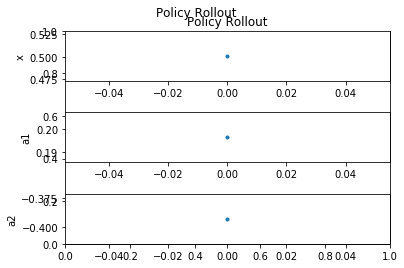

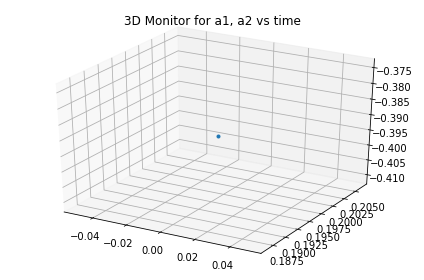

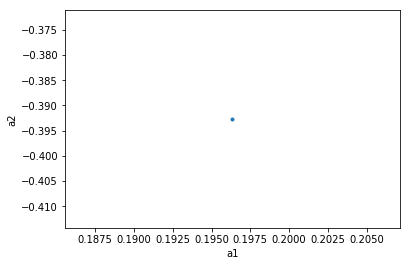

In 1 th iteration the initial state is:  (0.19634954, 0.19634954, -0.39269908)
In 1 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  1 th iteration, the robot moved  0.15396831962223934  in x direction


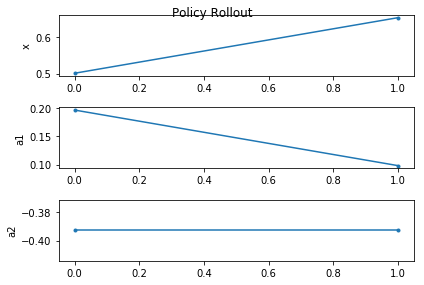

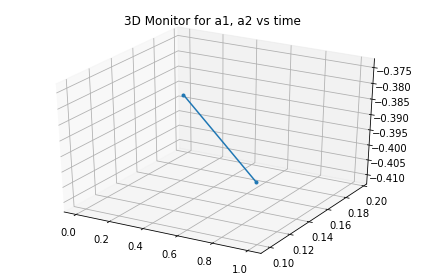

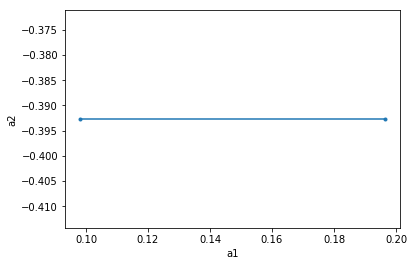

In 2 th iteration the initial state is:  (0.29452431, 0.09817477, -0.39269908)
In 2 th iteration the chosen action is:  (0.29452431000000001, 0.29452431000000001)
In  2 th iteration, the robot moved  -1.1462850472727966  in x direction


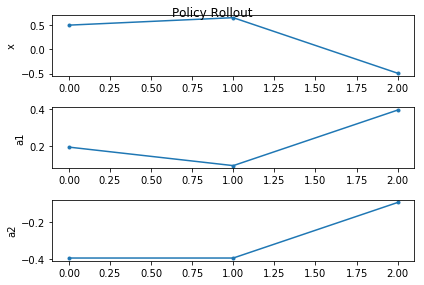

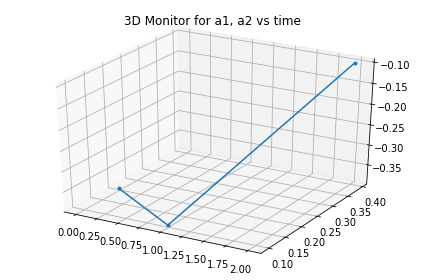

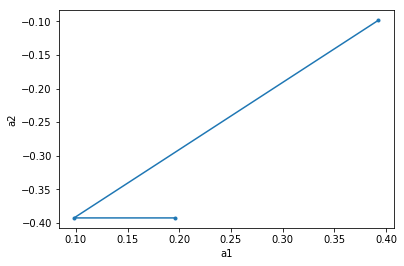

In 3 th iteration the initial state is:  (0.09817477, 0.39269908, -0.09817477)
In 3 th iteration the chosen action is:  (-0.19634953999999999, -0.098174769999999995)
In  3 th iteration, the robot moved  0.5680383185425885  in x direction


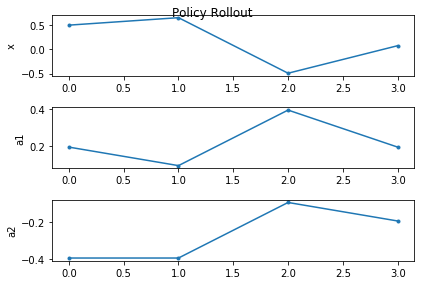

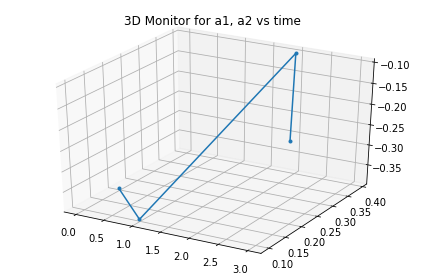

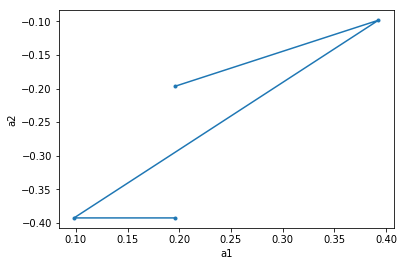

In 4 th iteration the initial state is:  (0.29452431, 0.19634954, -0.19634954)
In 4 th iteration the chosen action is:  (-0.098174769999999995, -0.098174769999999995)
In  4 th iteration, the robot moved  0.47230546323073486  in x direction


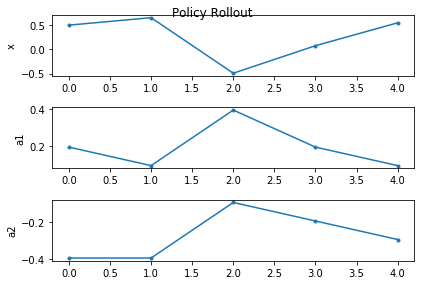

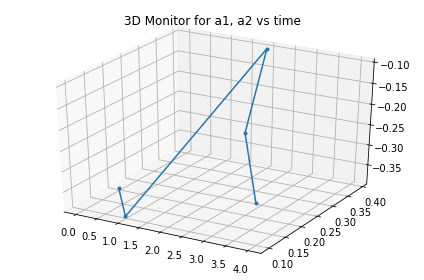

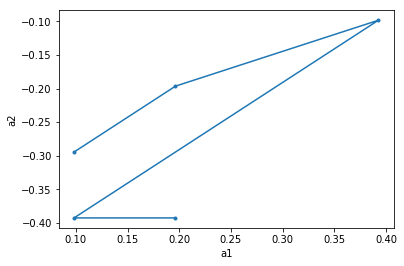

In 5 th iteration the initial state is:  (0.39269908, 0.09817477, -0.29452431)
In 5 th iteration the chosen action is:  (0.29452431000000001, 0.0)
In  5 th iteration, the robot moved  -0.6772982338538  in x direction


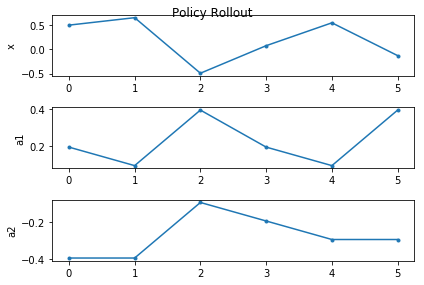

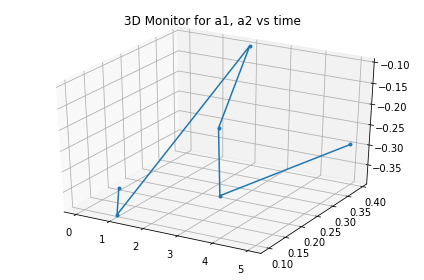

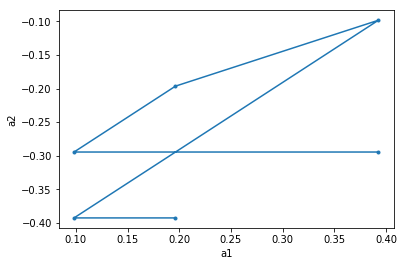

In 6 th iteration the initial state is:  (0.19634954, 0.39269908, -0.29452431)
In 6 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  6 th iteration, the robot moved  0.12497750916062701  in x direction


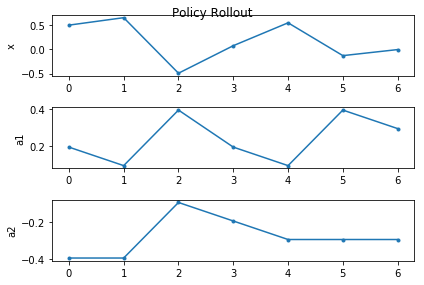

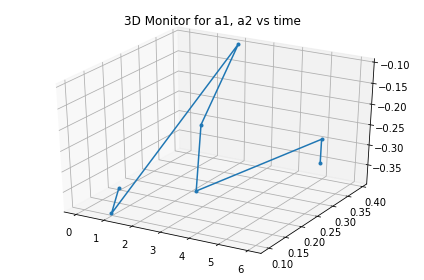

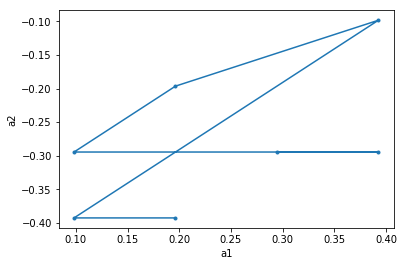

In 7 th iteration the initial state is:  (0.29452431, 0.29452431, -0.29452431)
In 7 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  7 th iteration, the robot moved  0.14788364281033645  in x direction


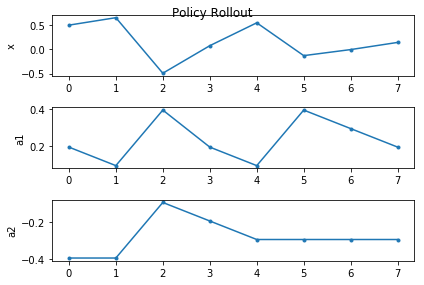

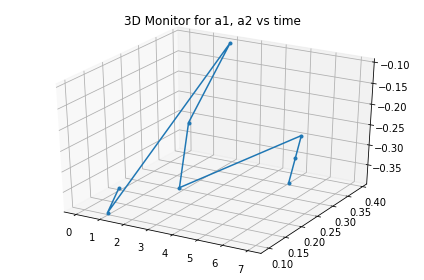

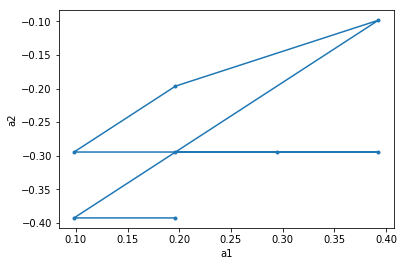

In 8 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 8 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  8 th iteration, the robot moved  0.18777782447860925  in x direction


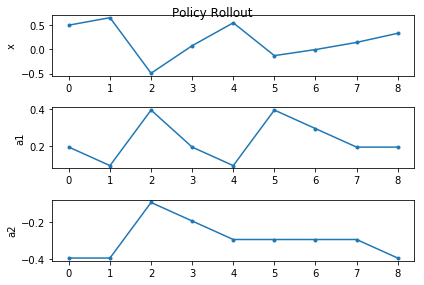

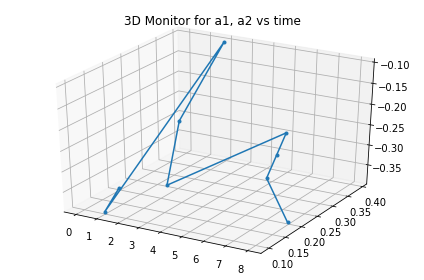

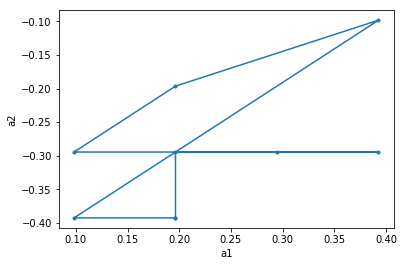

In 9 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 9 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  9 th iteration, the robot moved  -0.6206024669245332  in x direction


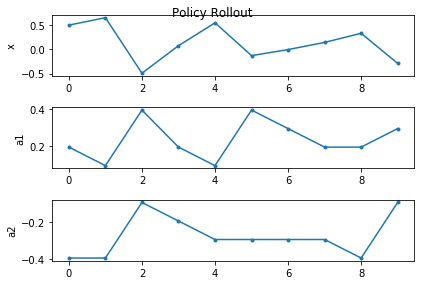

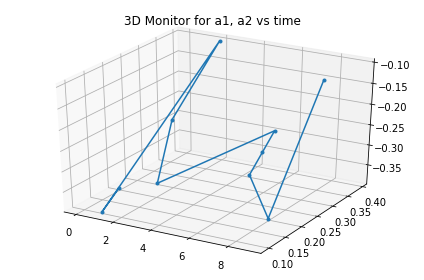

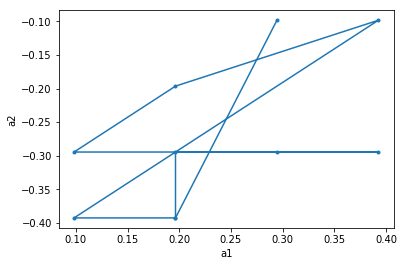

In 10 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 10 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  10 th iteration, the robot moved  0.22918484166091574  in x direction


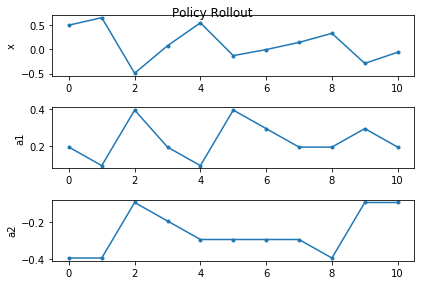

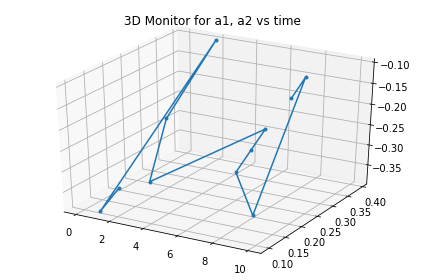

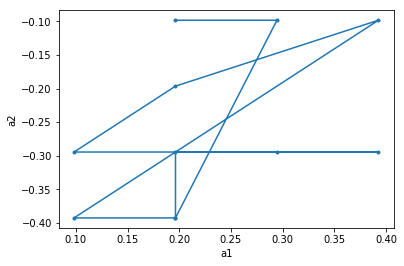

In 11 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 11 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  11 th iteration, the robot moved  0.30795840903019556  in x direction


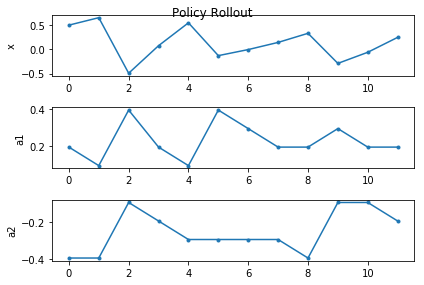

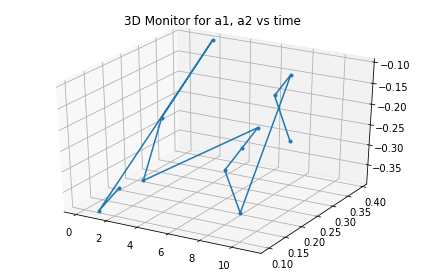

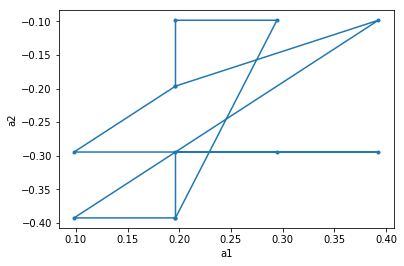

In 12 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 12 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  12 th iteration, the robot moved  0.23246068827449184  in x direction


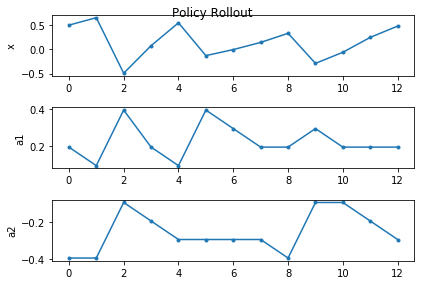

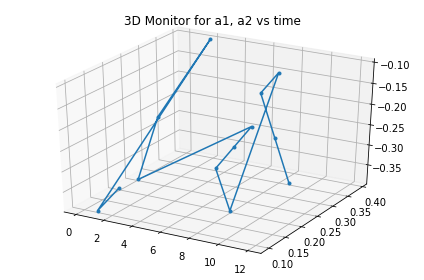

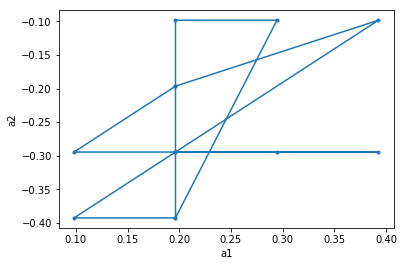

In 13 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 13 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  13 th iteration, the robot moved  0.18777782447860925  in x direction


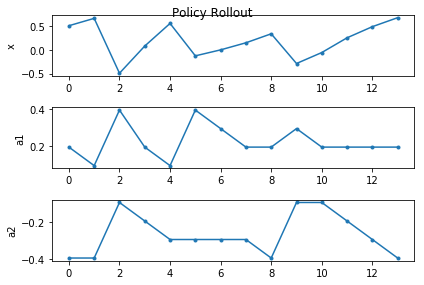

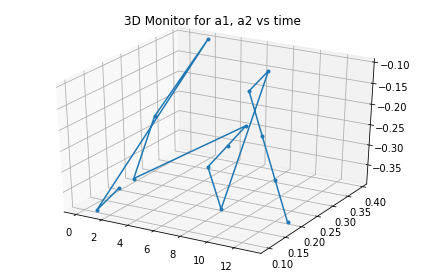

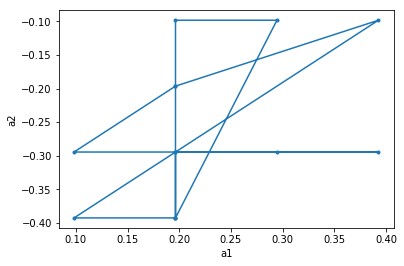

In 14 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 14 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  14 th iteration, the robot moved  -0.6206024669245332  in x direction


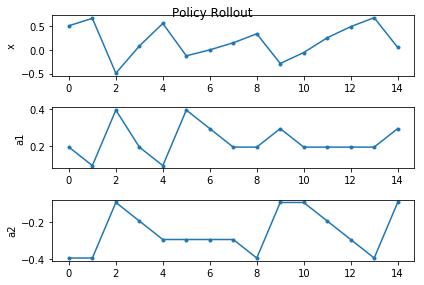

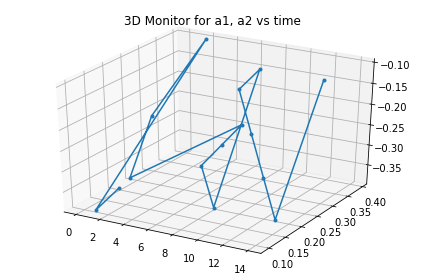

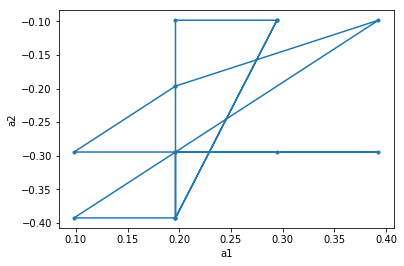

In 15 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 15 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  15 th iteration, the robot moved  0.22918484166091574  in x direction


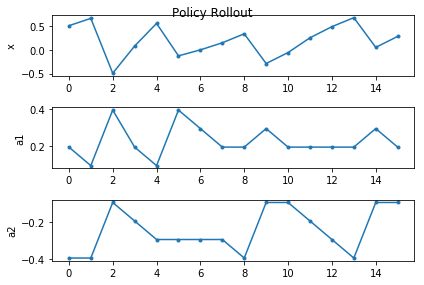

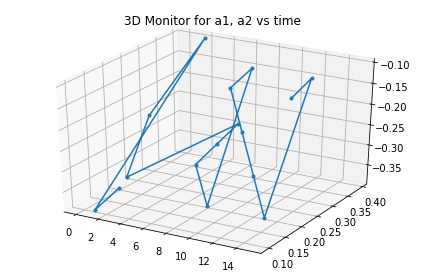

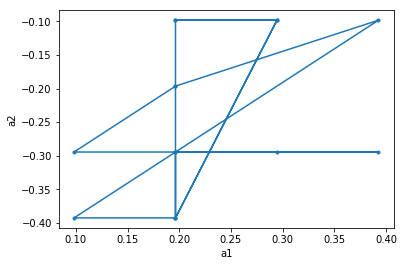

In 16 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 16 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  16 th iteration, the robot moved  0.3079584090301956  in x direction


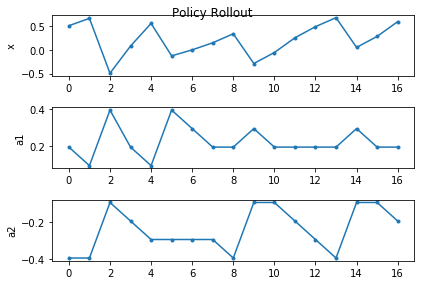

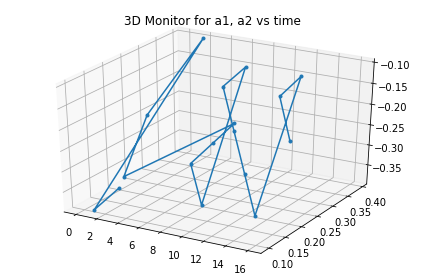

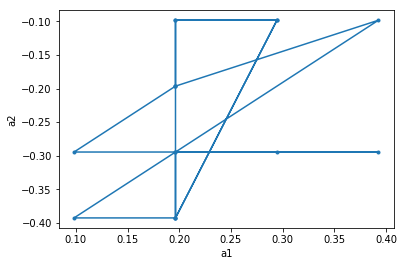

In 17 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 17 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  17 th iteration, the robot moved  0.23246068827449184  in x direction


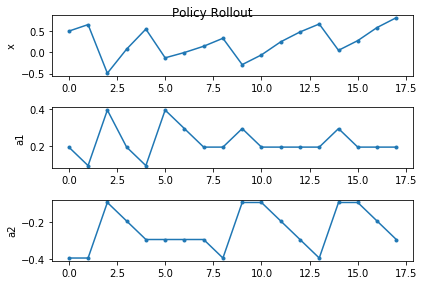

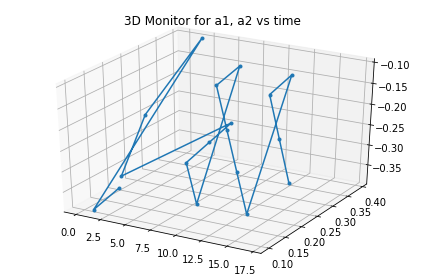

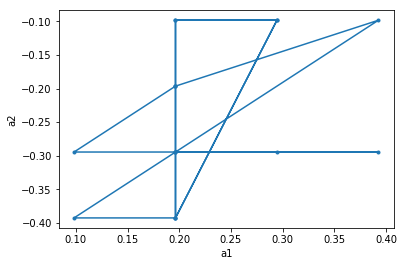

In 18 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 18 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  18 th iteration, the robot moved  0.18777782447860936  in x direction


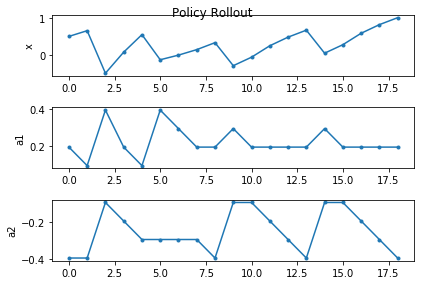

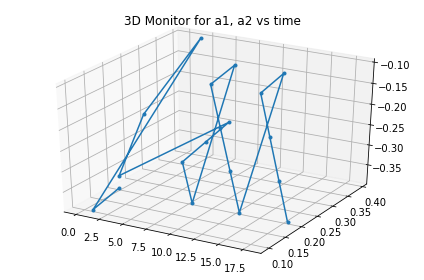

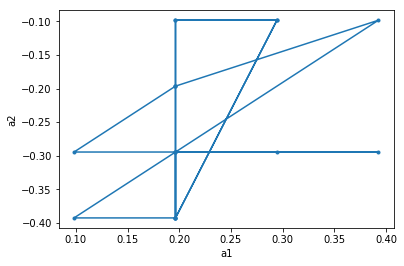

In 19 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 19 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  19 th iteration, the robot moved  -0.6206024669245332  in x direction


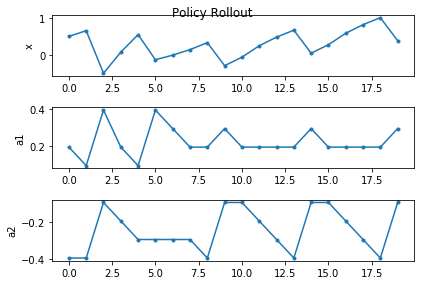

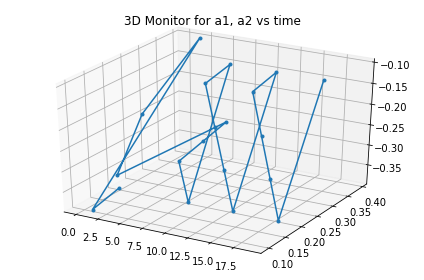

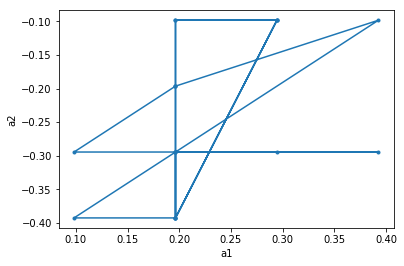

In 20 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 20 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  20 th iteration, the robot moved  0.2291848416609158  in x direction


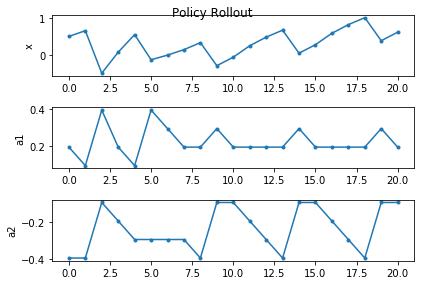

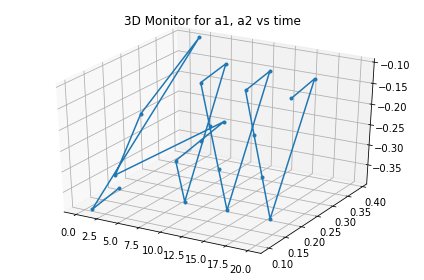

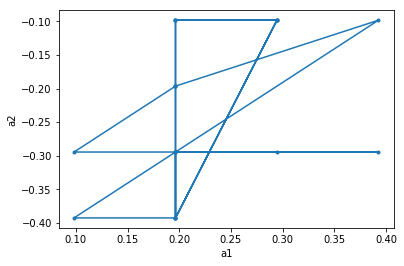

In 21 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 21 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  21 th iteration, the robot moved  0.30795840903019556  in x direction


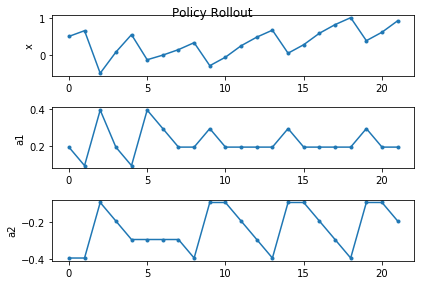

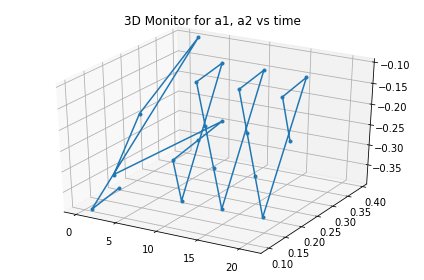

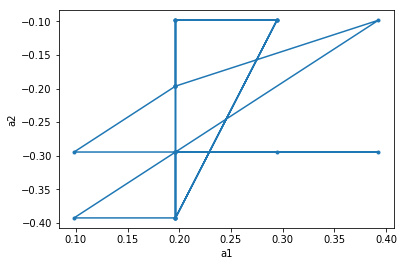

In 22 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 22 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  22 th iteration, the robot moved  0.23246068827449184  in x direction


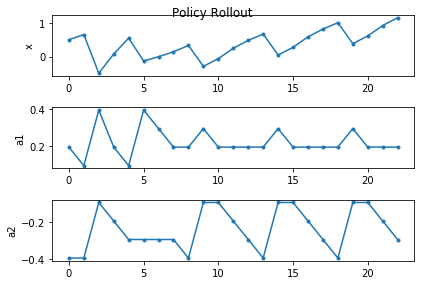

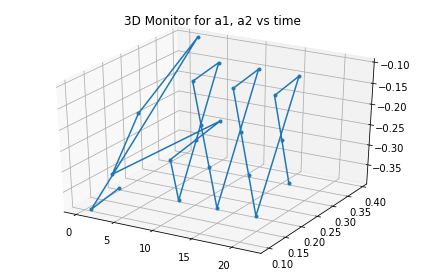

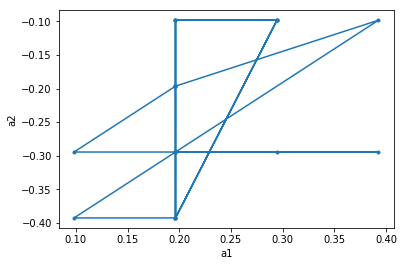

In 23 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 23 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  23 th iteration, the robot moved  0.18777782447860925  in x direction


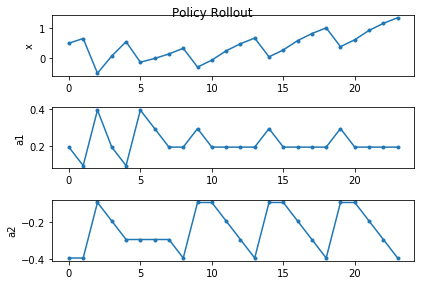

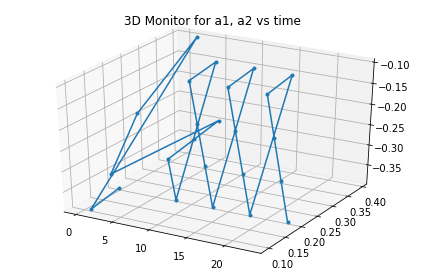

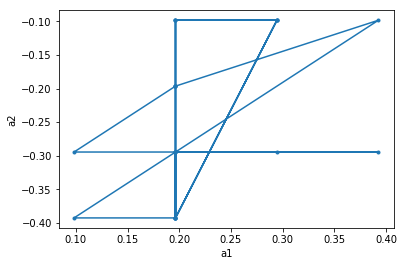

In 24 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 24 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  24 th iteration, the robot moved  -0.6206024669245332  in x direction


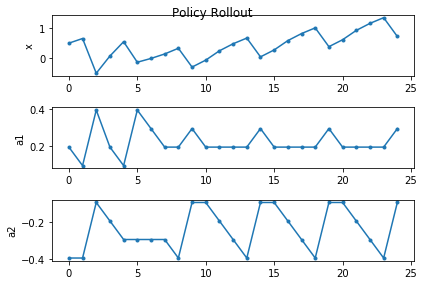

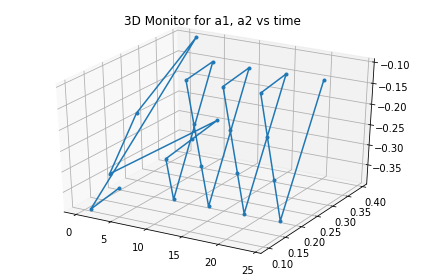

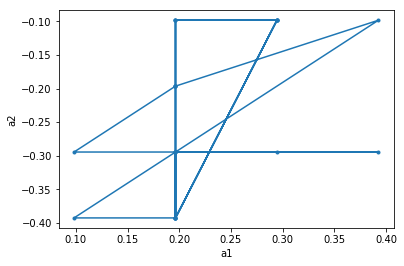

In 25 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 25 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  25 th iteration, the robot moved  0.2291848416609158  in x direction


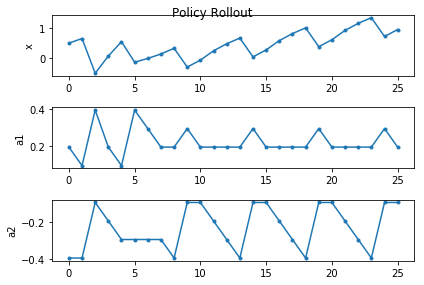

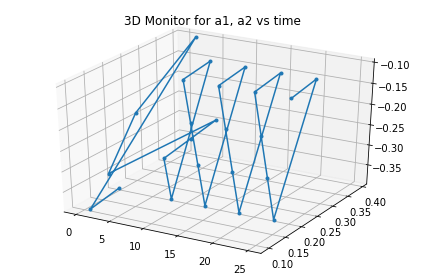

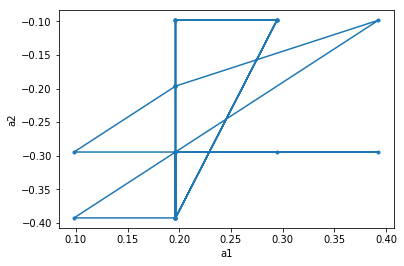

In 26 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 26 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  26 th iteration, the robot moved  0.30795840903019545  in x direction


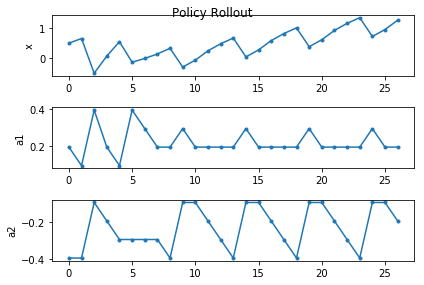

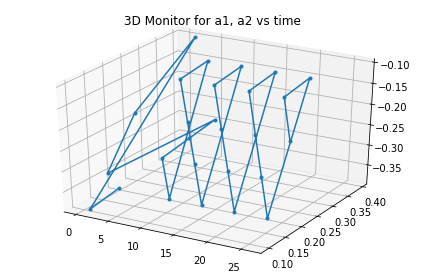

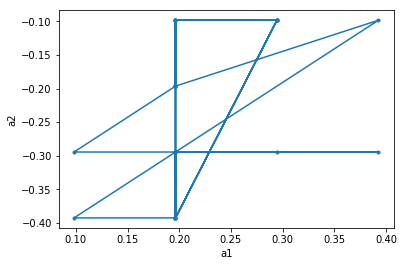

In 27 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 27 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  27 th iteration, the robot moved  0.23246068827449196  in x direction


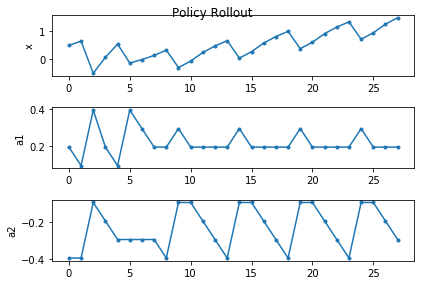

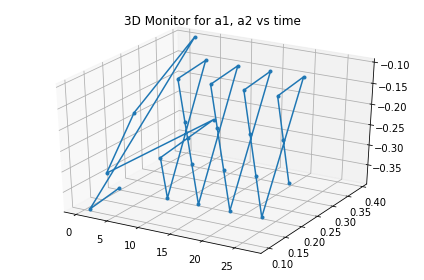

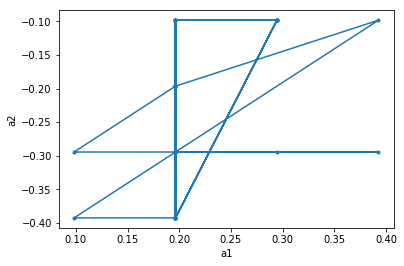

In 28 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 28 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  28 th iteration, the robot moved  0.18777782447860925  in x direction


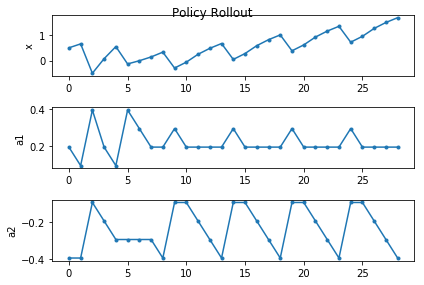

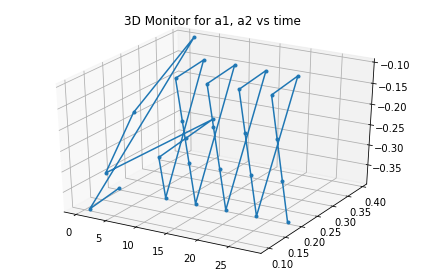

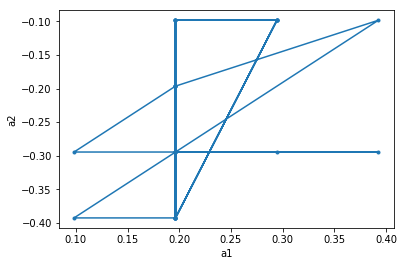

In 29 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 29 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  29 th iteration, the robot moved  -0.6206024669245331  in x direction


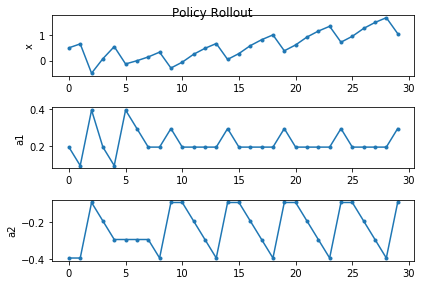

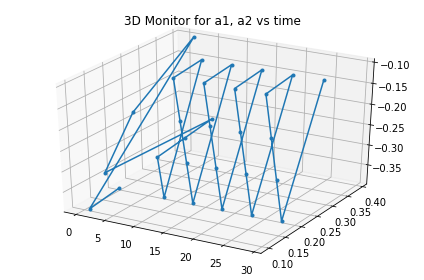

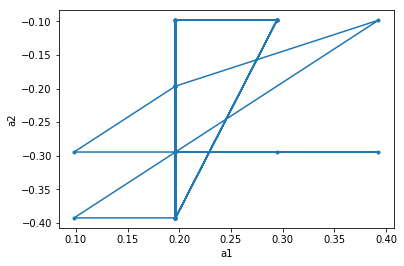

In 30 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 30 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  30 th iteration, the robot moved  0.22918484166091568  in x direction


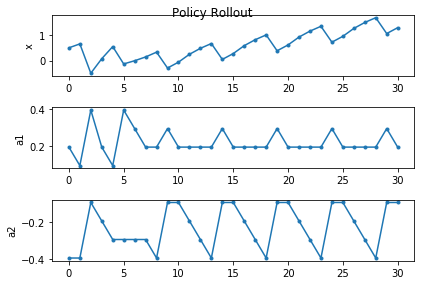

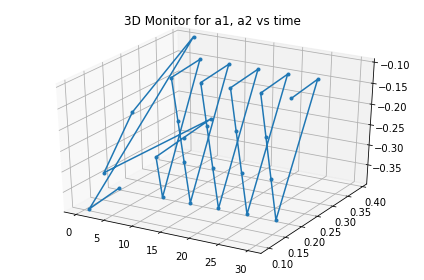

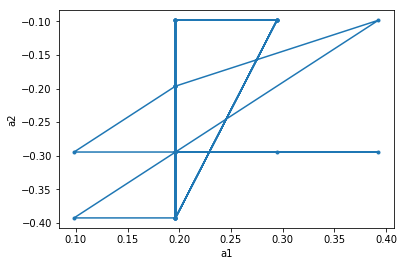

In 31 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 31 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  31 th iteration, the robot moved  0.30795840903019567  in x direction


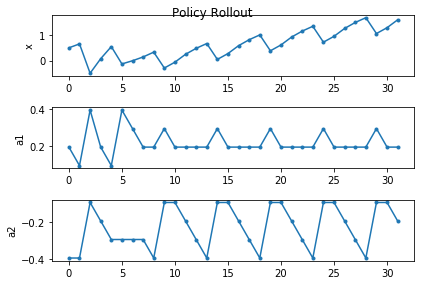

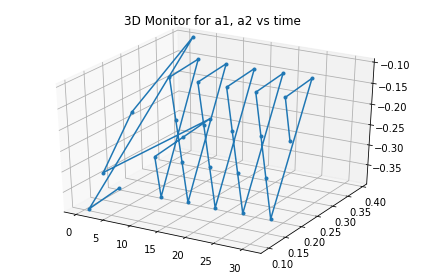

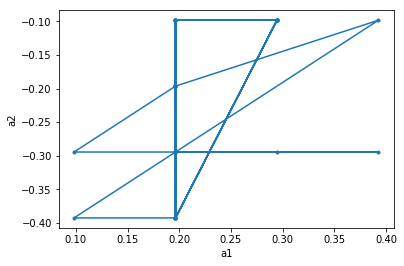

In 32 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 32 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  32 th iteration, the robot moved  0.23246068827449196  in x direction


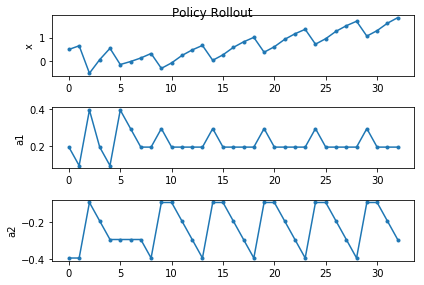

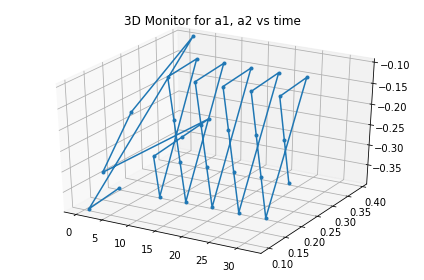

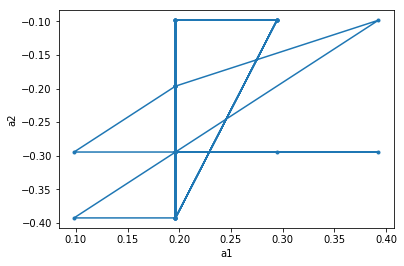

In 33 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 33 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  33 th iteration, the robot moved  0.18777782447860925  in x direction


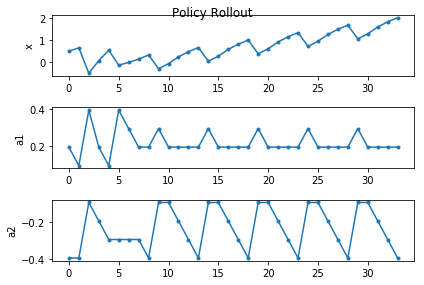

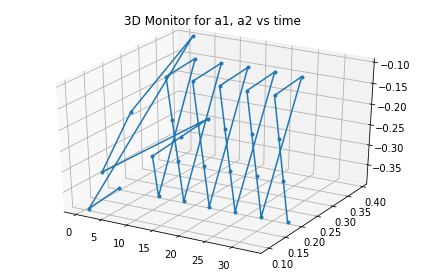

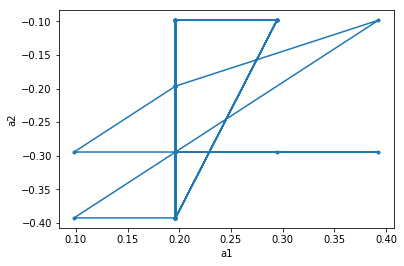

In 34 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 34 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  34 th iteration, the robot moved  -0.6206024669245331  in x direction


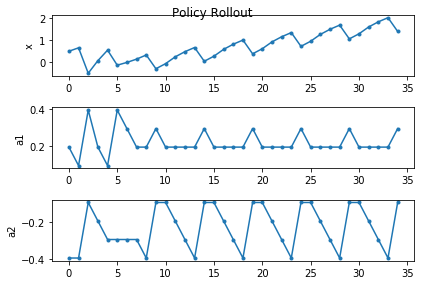

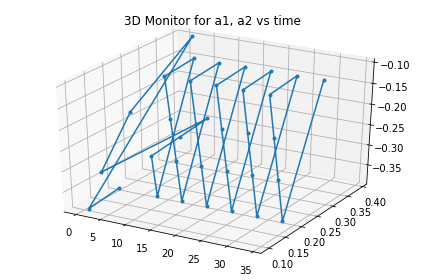

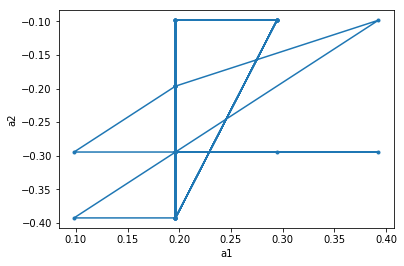

In 35 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 35 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  35 th iteration, the robot moved  0.22918484166091568  in x direction


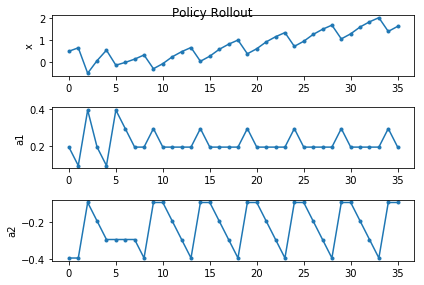

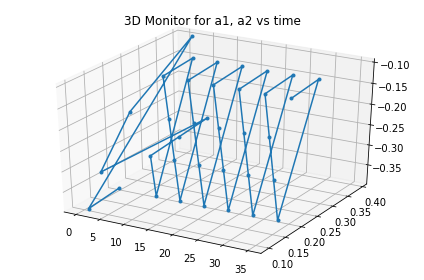

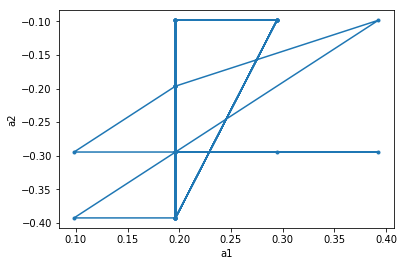

In 36 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 36 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  36 th iteration, the robot moved  0.30795840903019567  in x direction


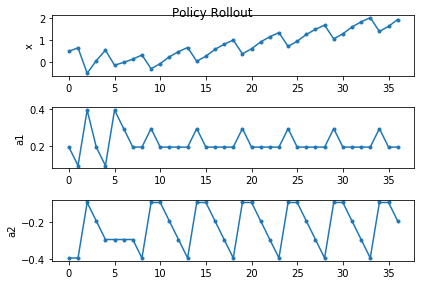

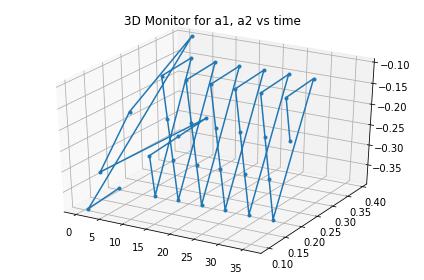

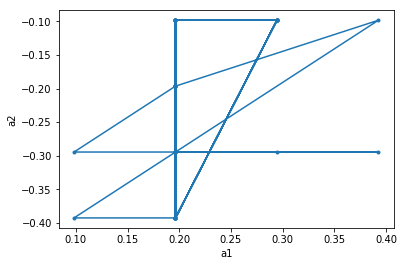

In 37 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 37 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  37 th iteration, the robot moved  0.23246068827449173  in x direction


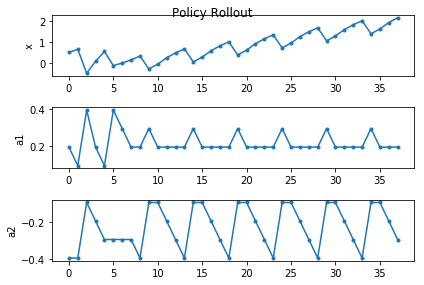

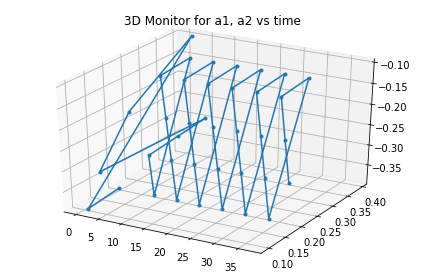

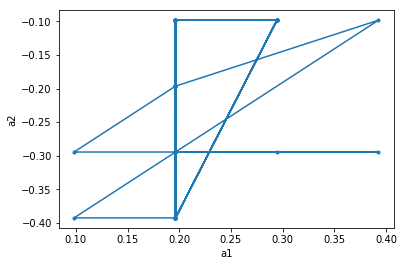

In 38 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 38 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  38 th iteration, the robot moved  0.18777782447860902  in x direction


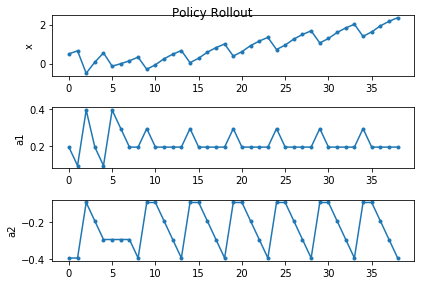

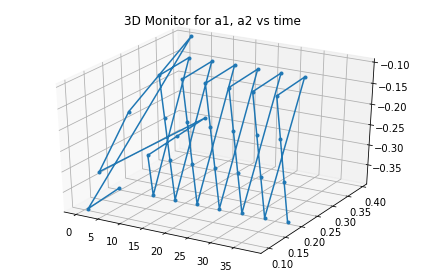

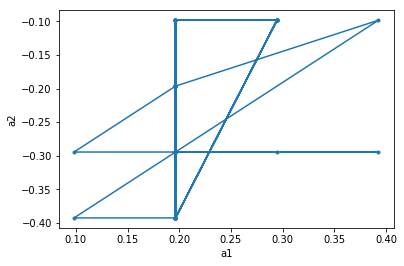

In 39 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 39 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  39 th iteration, the robot moved  -0.6206024669245331  in x direction


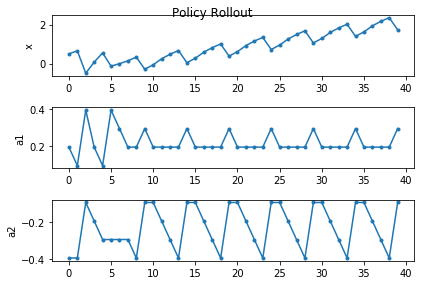

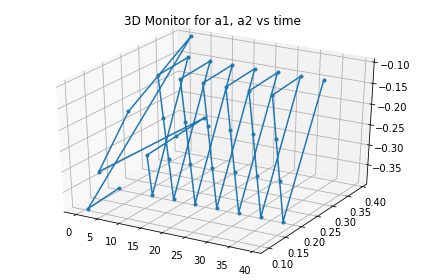

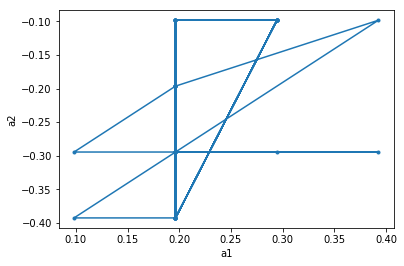

In 40 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 40 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  40 th iteration, the robot moved  0.22918484166091568  in x direction


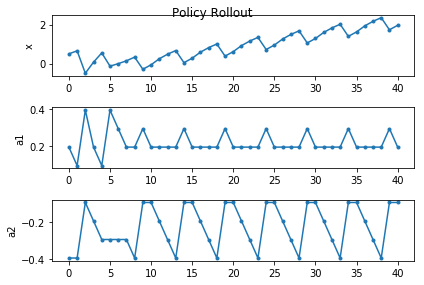

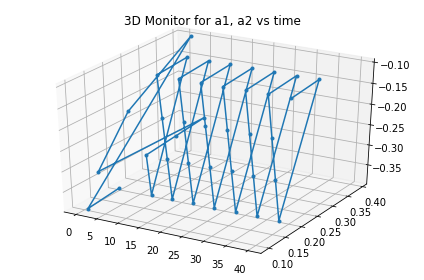

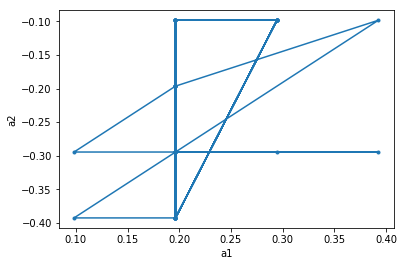

In 41 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 41 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  41 th iteration, the robot moved  0.30795840903019567  in x direction


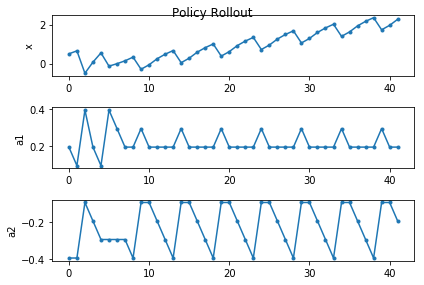

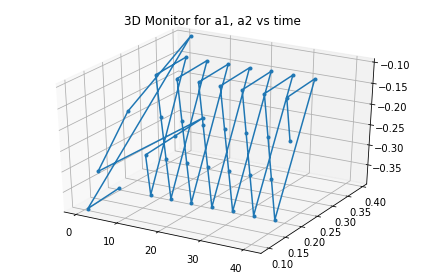

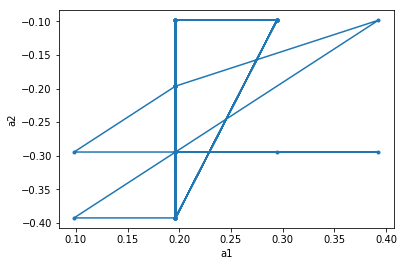

In 42 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 42 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  42 th iteration, the robot moved  0.23246068827449173  in x direction


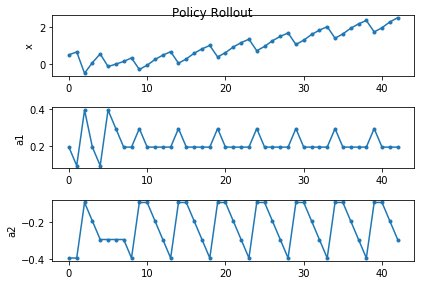

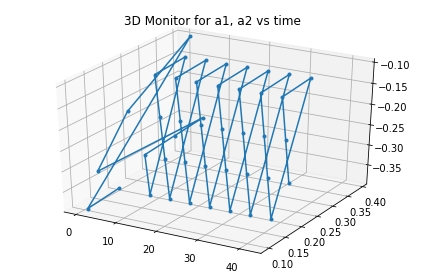

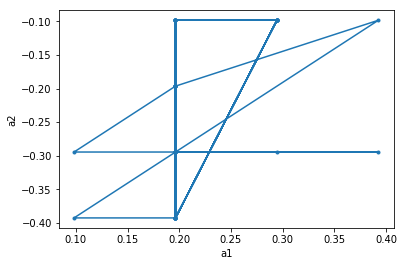

In 43 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 43 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  43 th iteration, the robot moved  0.18777782447860902  in x direction


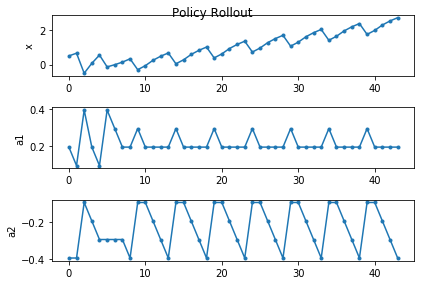

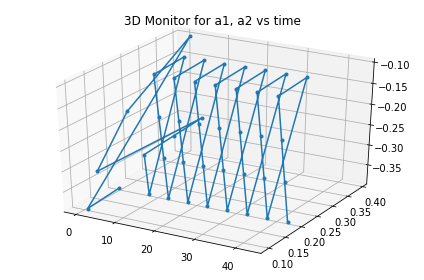

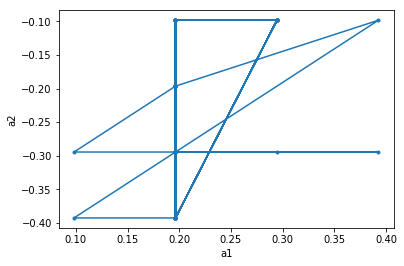

In 44 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 44 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  44 th iteration, the robot moved  -0.6206024669245331  in x direction


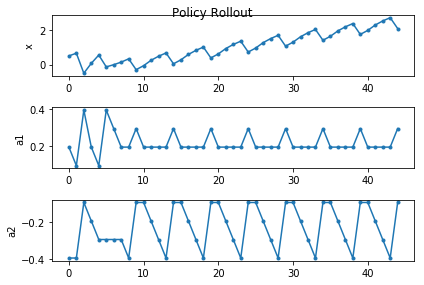

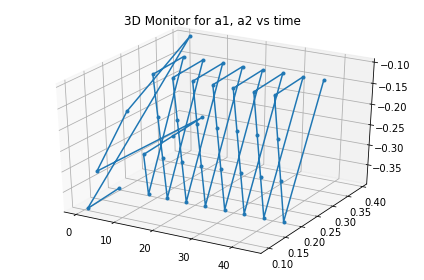

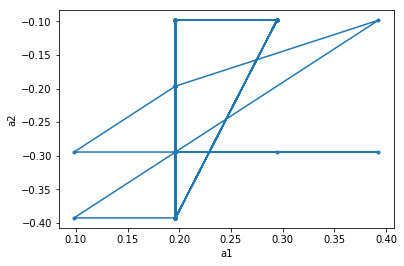

In 45 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 45 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  45 th iteration, the robot moved  0.22918484166091568  in x direction


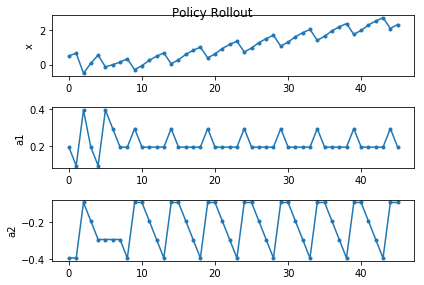

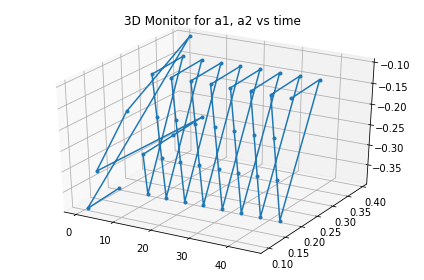

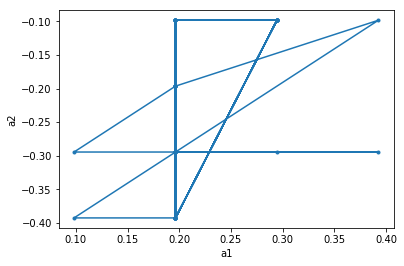

In 46 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 46 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  46 th iteration, the robot moved  0.30795840903019567  in x direction


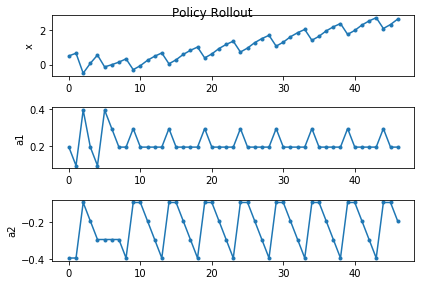

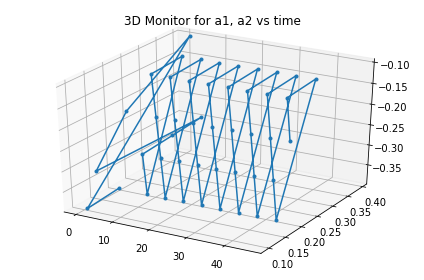

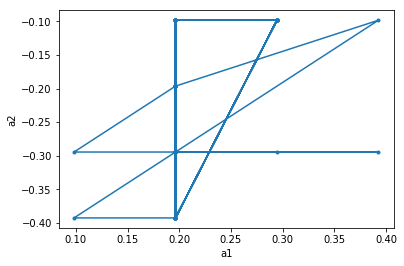

In 47 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 47 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  47 th iteration, the robot moved  0.23246068827449173  in x direction


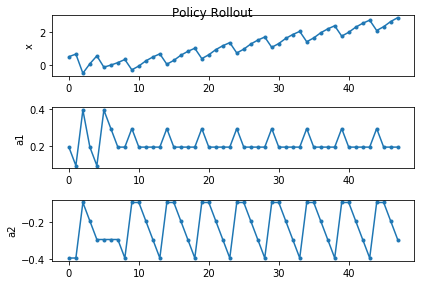

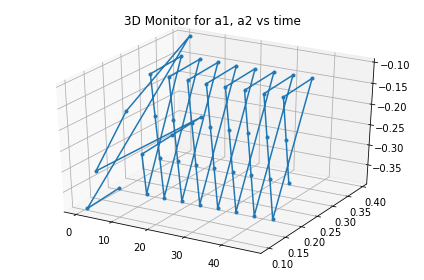

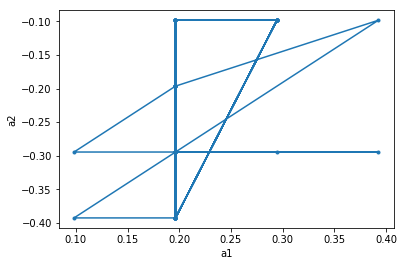

In 48 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 48 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  48 th iteration, the robot moved  0.18777782447860902  in x direction


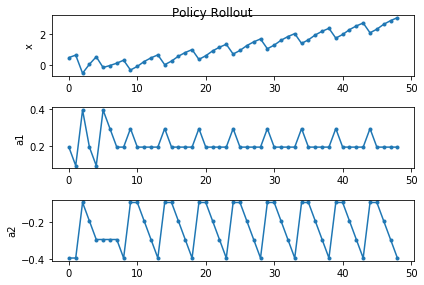

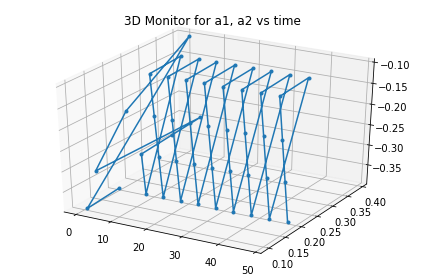

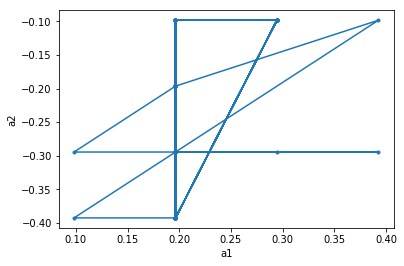

In 49 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 49 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  49 th iteration, the robot moved  -0.6206024669245331  in x direction


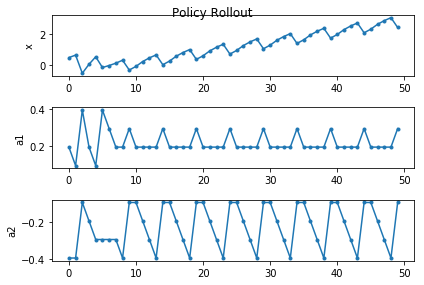

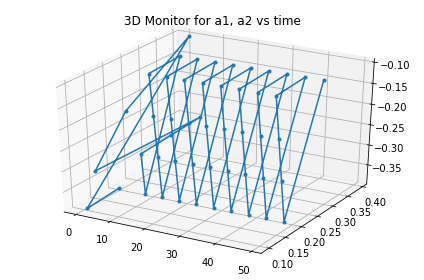

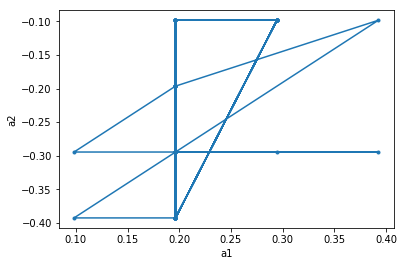

In 50 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 50 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  50 th iteration, the robot moved  0.22918484166091568  in x direction


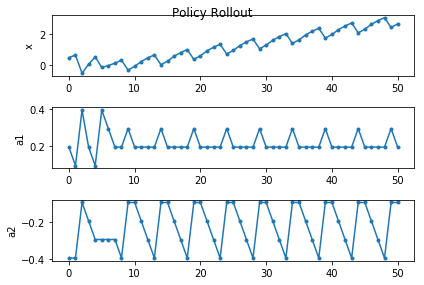

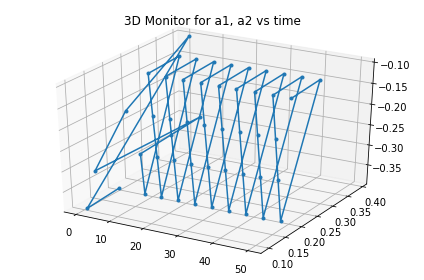

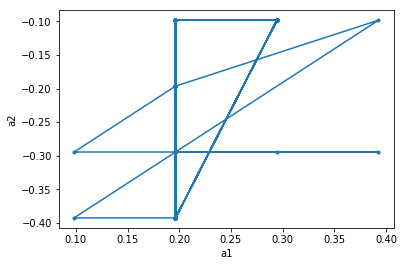

In 51 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 51 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  51 th iteration, the robot moved  0.30795840903019567  in x direction


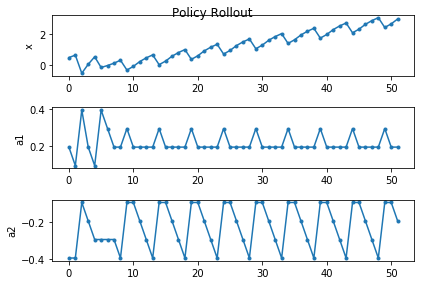

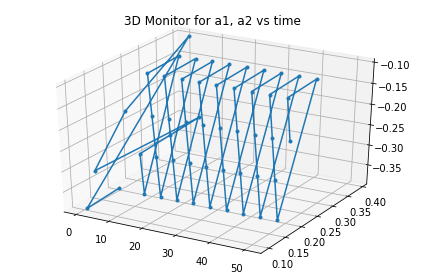

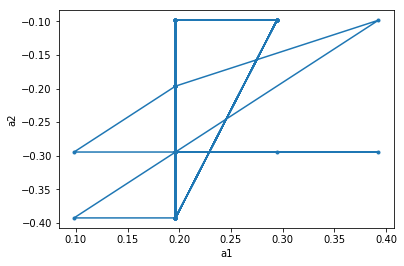

In 52 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 52 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  52 th iteration, the robot moved  0.23246068827449173  in x direction


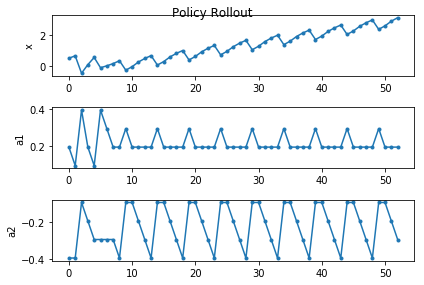

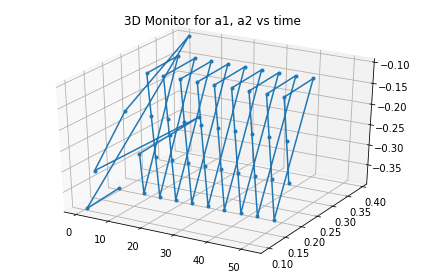

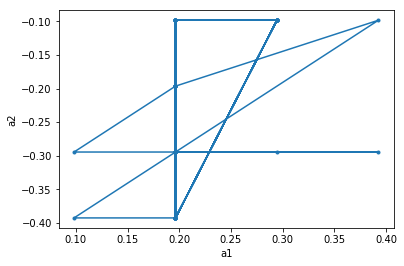

In 53 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 53 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  53 th iteration, the robot moved  0.18777782447860902  in x direction


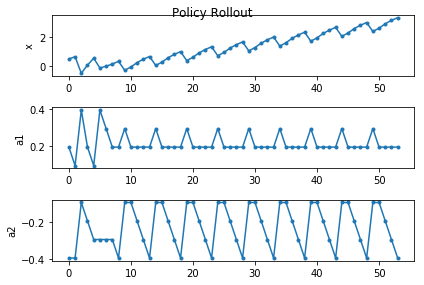

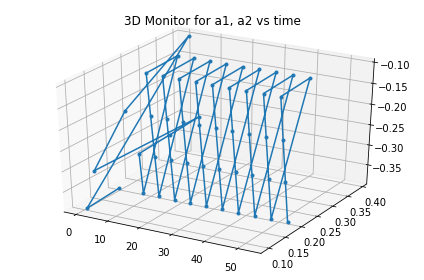

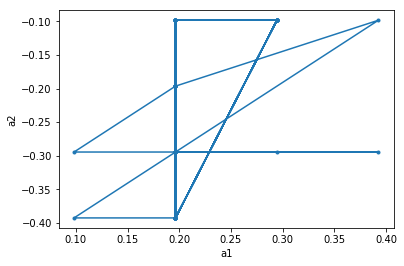

In 54 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 54 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  54 th iteration, the robot moved  -0.6206024669245331  in x direction


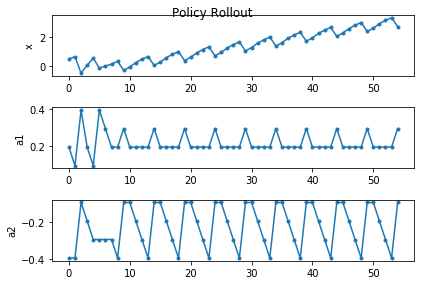

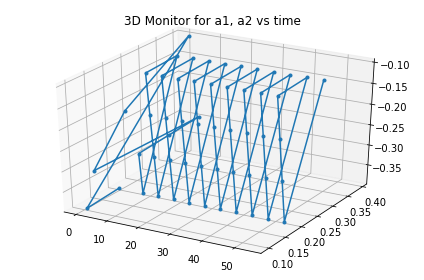

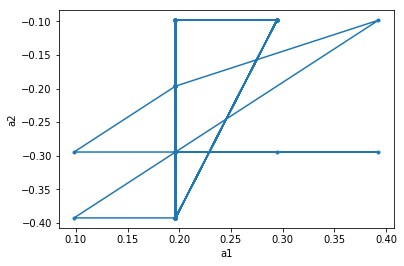

In 55 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 55 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  55 th iteration, the robot moved  0.22918484166091568  in x direction


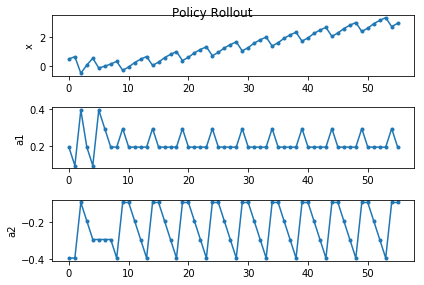

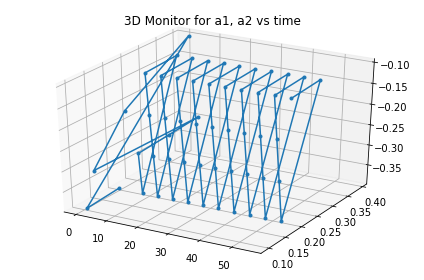

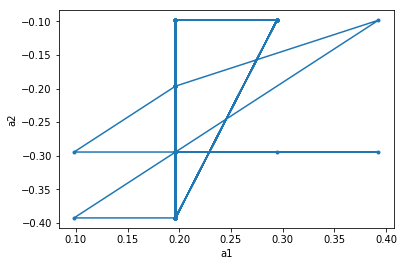

In 56 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 56 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  56 th iteration, the robot moved  0.30795840903019567  in x direction


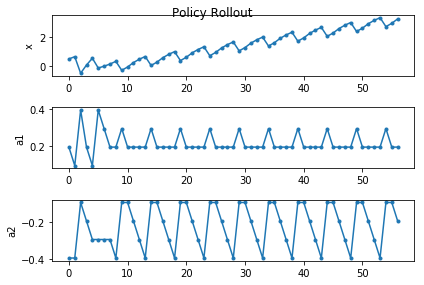

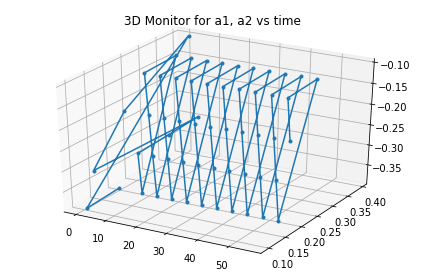

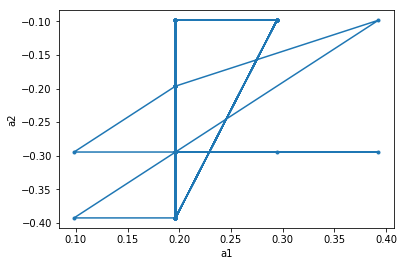

In 57 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 57 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  57 th iteration, the robot moved  0.23246068827449173  in x direction


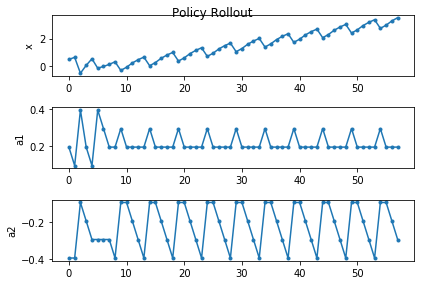

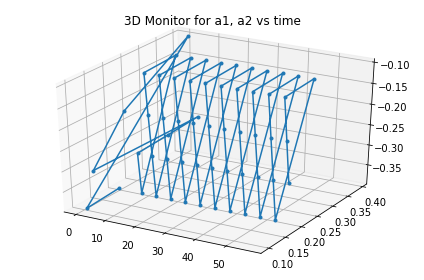

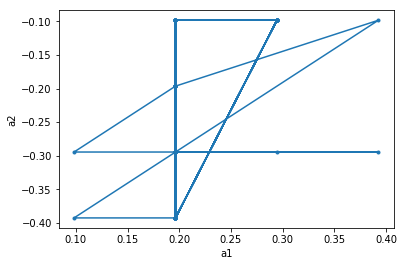

In 58 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 58 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  58 th iteration, the robot moved  0.18777782447860902  in x direction


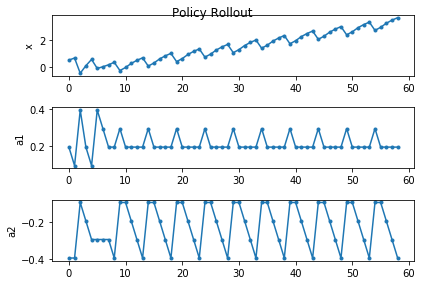

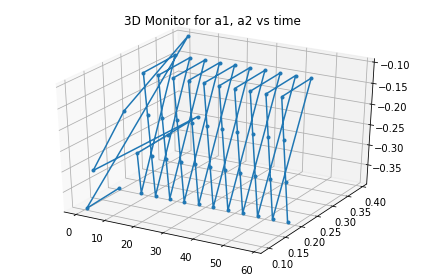

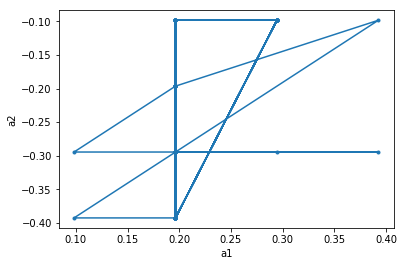

In 59 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 59 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  59 th iteration, the robot moved  -0.6206024669245331  in x direction


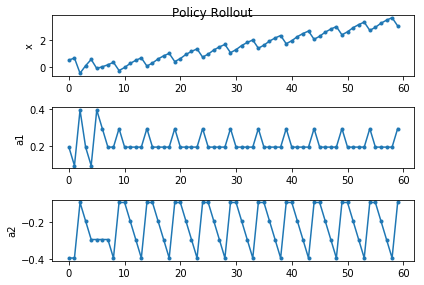

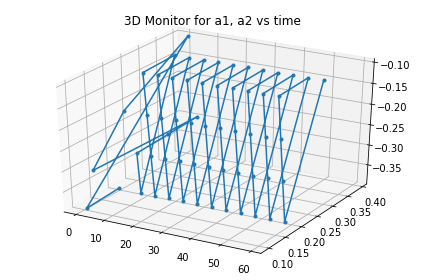

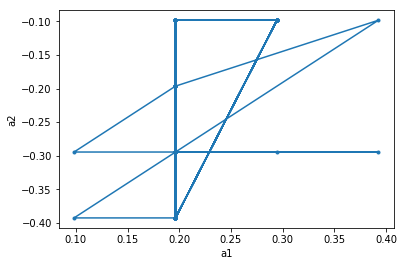

In 60 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 60 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  60 th iteration, the robot moved  0.22918484166091568  in x direction


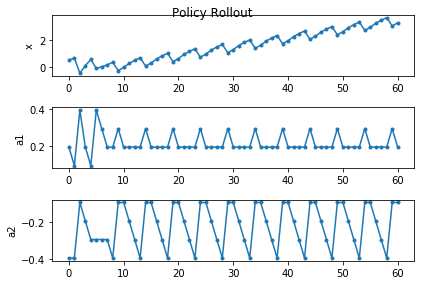

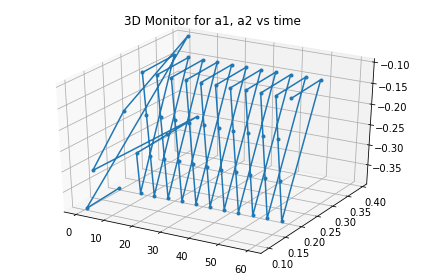

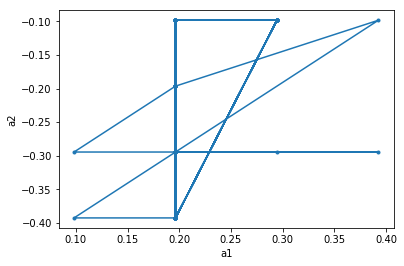

In 61 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 61 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  61 th iteration, the robot moved  0.30795840903019567  in x direction


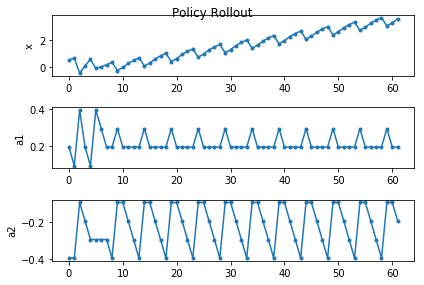

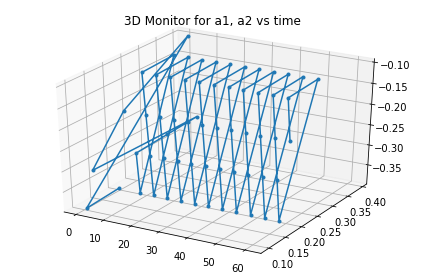

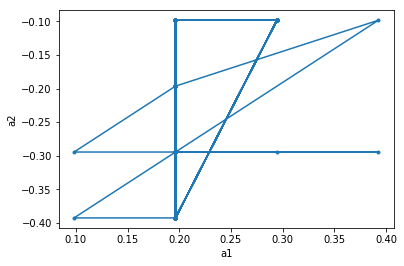

In 62 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 62 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  62 th iteration, the robot moved  0.23246068827449173  in x direction


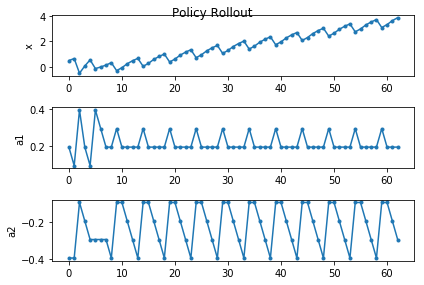

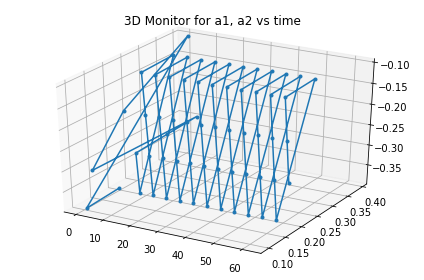

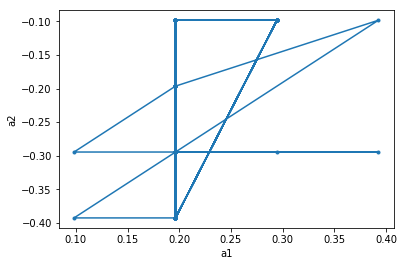

In 63 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 63 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  63 th iteration, the robot moved  0.18777782447860902  in x direction


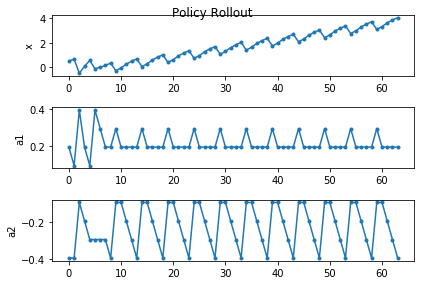

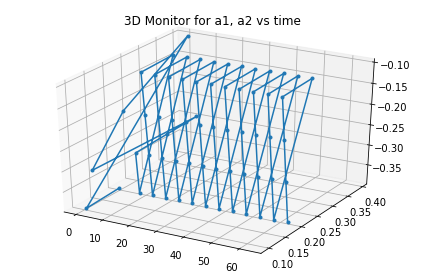

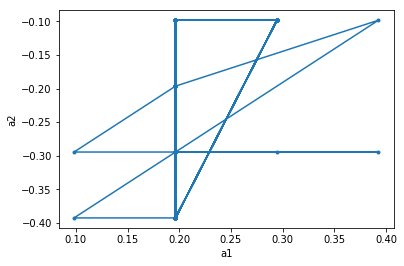

In 64 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 64 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  64 th iteration, the robot moved  -0.6206024669245331  in x direction


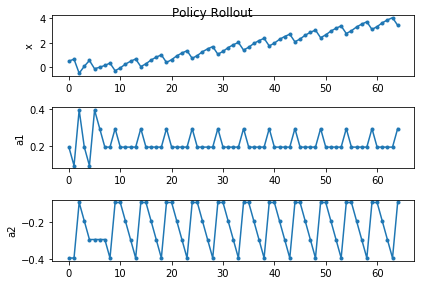

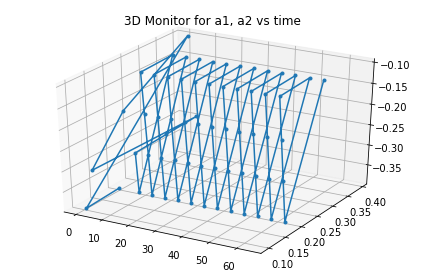

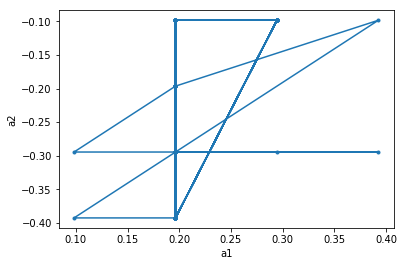

In 65 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 65 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  65 th iteration, the robot moved  0.22918484166091568  in x direction


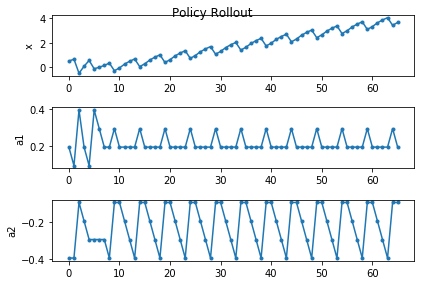

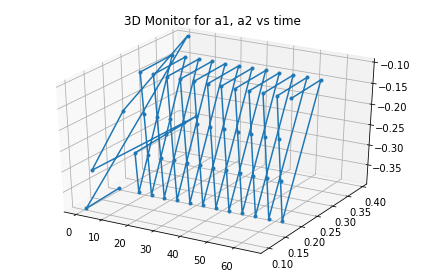

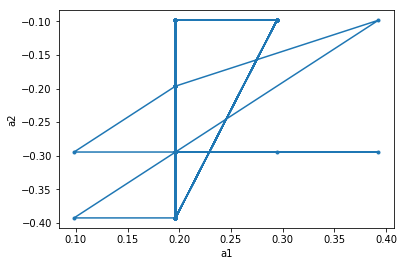

In 66 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 66 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  66 th iteration, the robot moved  0.30795840903019567  in x direction


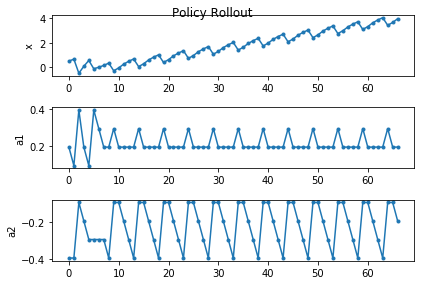

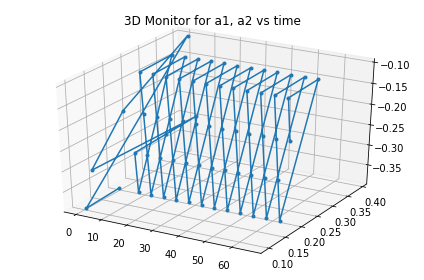

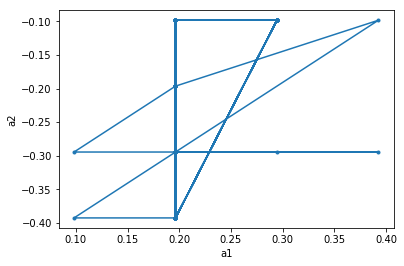

In 67 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 67 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  67 th iteration, the robot moved  0.23246068827449218  in x direction


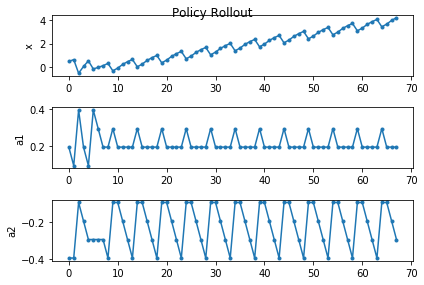

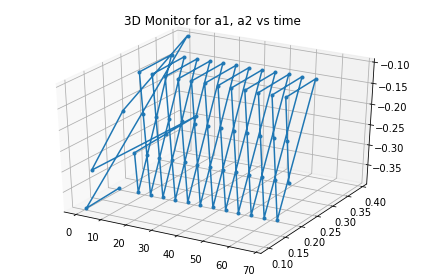

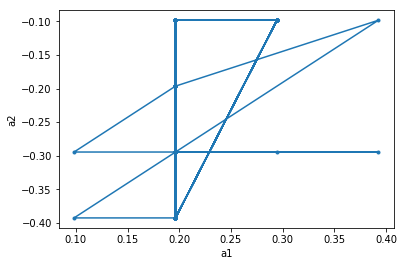

In 68 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 68 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  68 th iteration, the robot moved  0.18777782447860947  in x direction


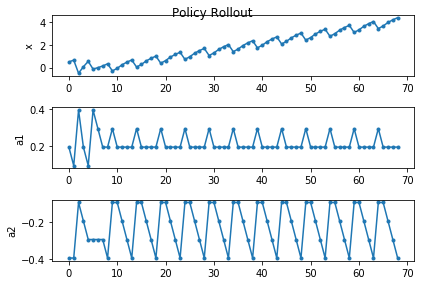

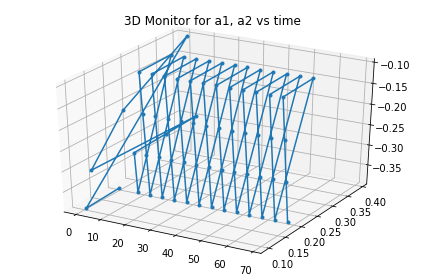

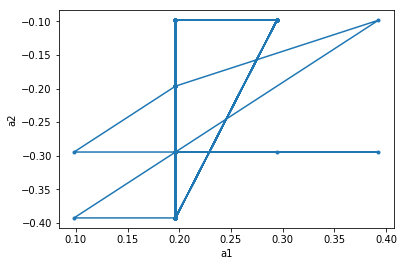

In 69 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 69 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  69 th iteration, the robot moved  -0.6206024669245331  in x direction


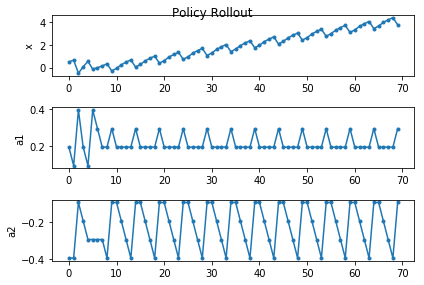

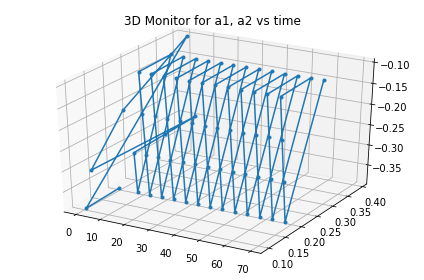

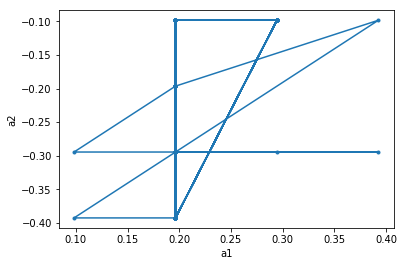

In 70 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 70 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  70 th iteration, the robot moved  0.22918484166091568  in x direction


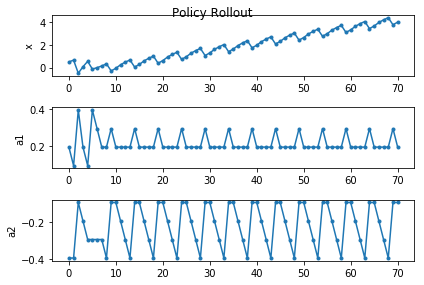

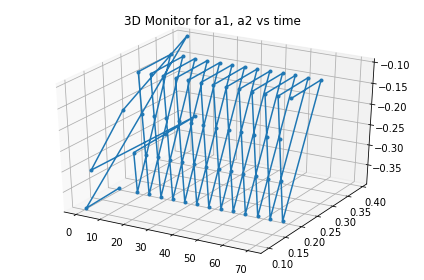

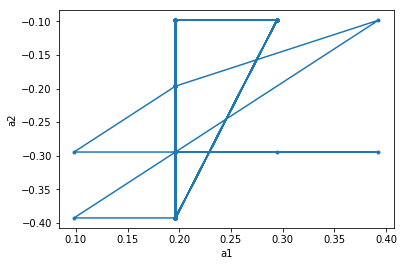

In 71 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 71 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  71 th iteration, the robot moved  0.30795840903019567  in x direction


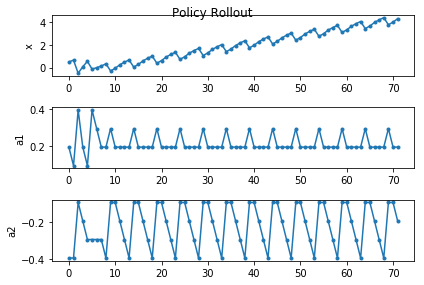

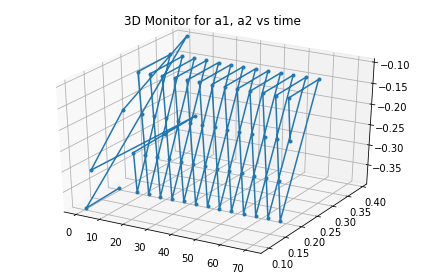

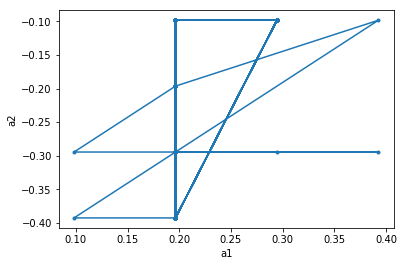

In 72 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 72 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  72 th iteration, the robot moved  0.23246068827449218  in x direction


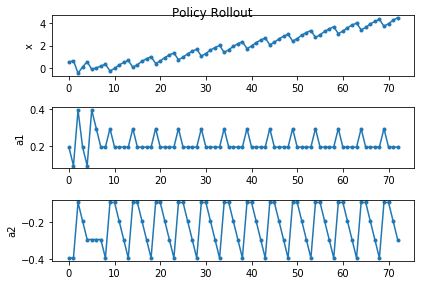

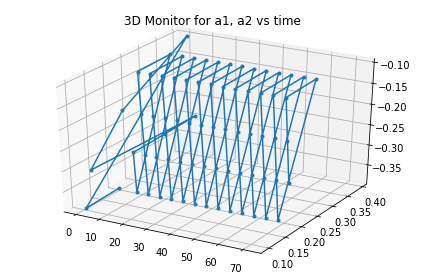

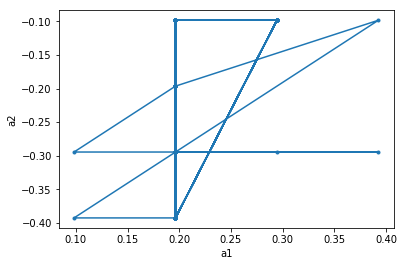

In 73 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 73 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  73 th iteration, the robot moved  0.18777782447860947  in x direction


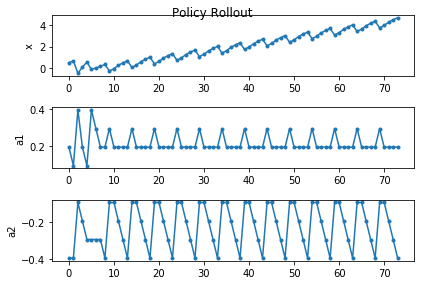

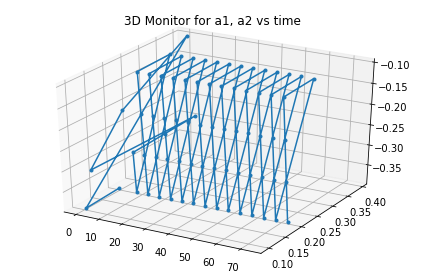

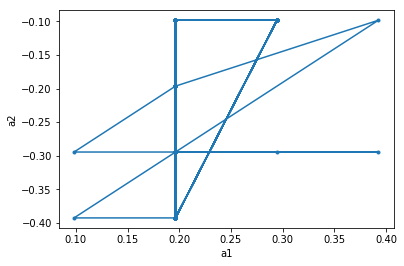

In 74 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 74 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  74 th iteration, the robot moved  -0.6206024669245336  in x direction


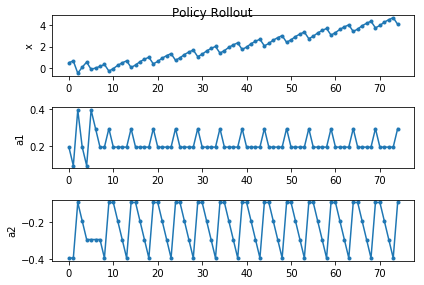

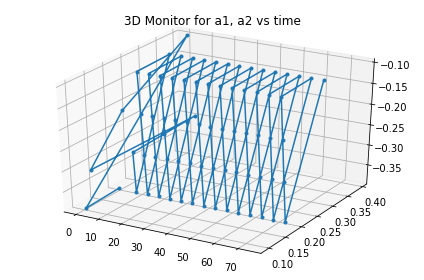

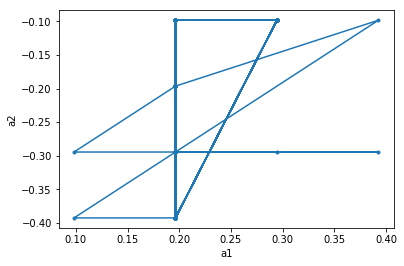

In 75 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 75 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  75 th iteration, the robot moved  0.22918484166091613  in x direction


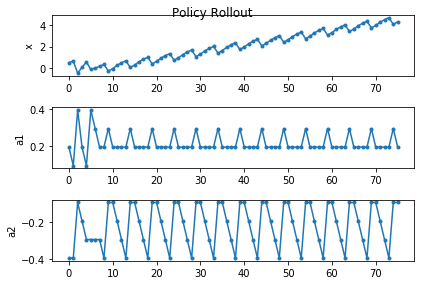

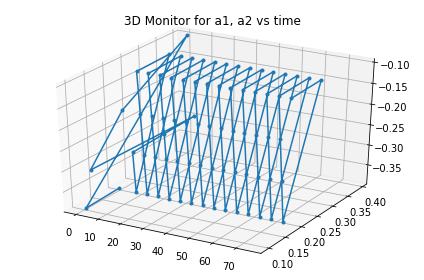

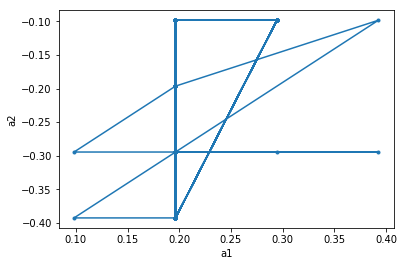

In 76 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 76 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  76 th iteration, the robot moved  0.30795840903019567  in x direction


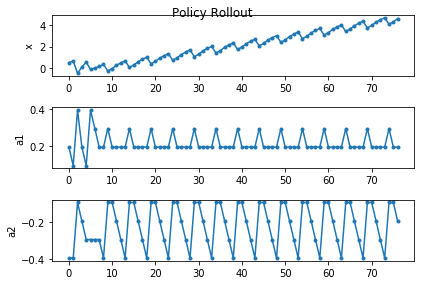

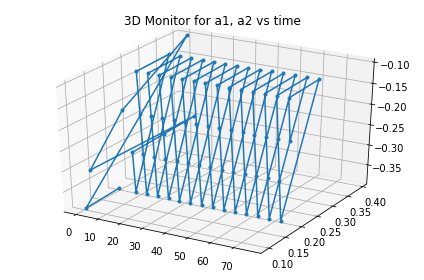

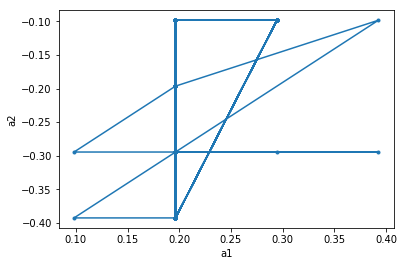

In 77 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 77 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  77 th iteration, the robot moved  0.23246068827449218  in x direction


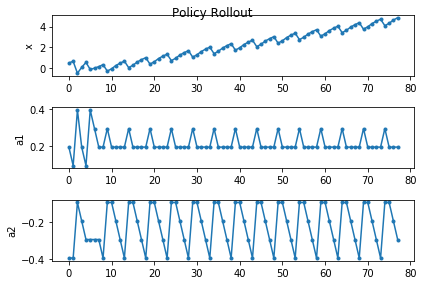

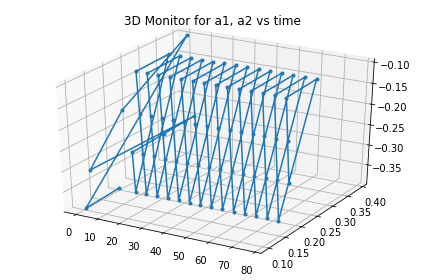

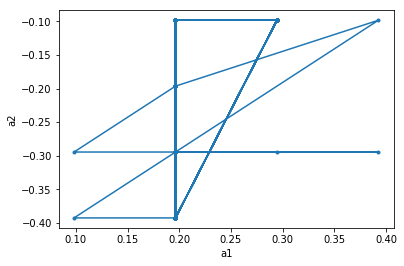

In 78 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 78 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  78 th iteration, the robot moved  0.18777782447860947  in x direction


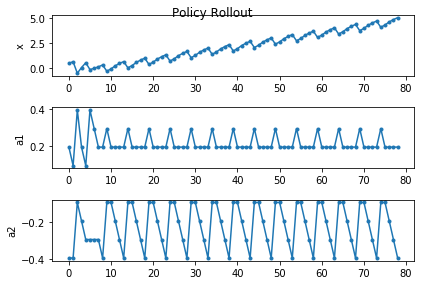

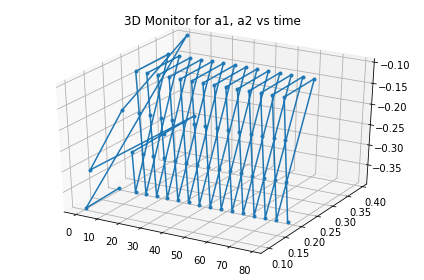

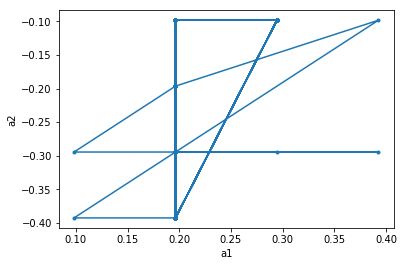

In 79 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 79 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  79 th iteration, the robot moved  -0.6206024669245336  in x direction


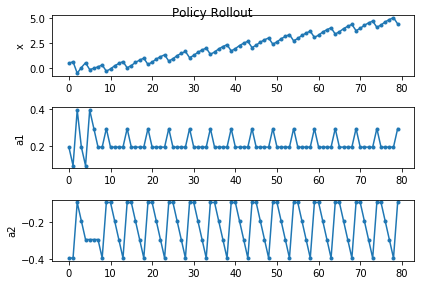

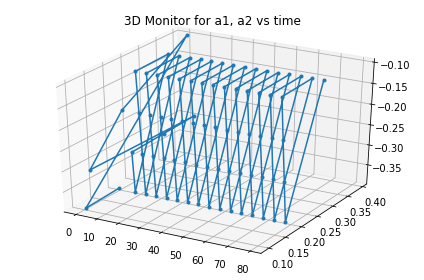

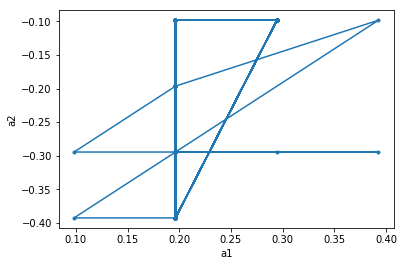

In 80 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 80 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  80 th iteration, the robot moved  0.22918484166091613  in x direction


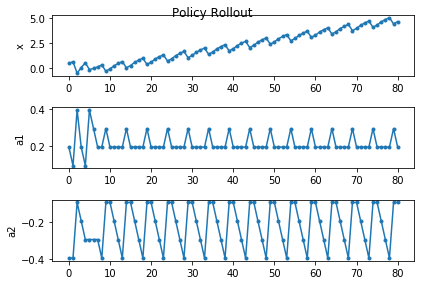

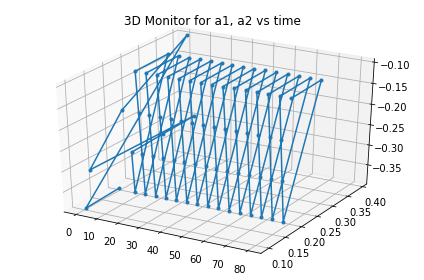

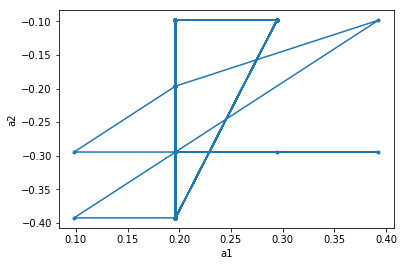

In 81 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 81 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  81 th iteration, the robot moved  0.30795840903019567  in x direction


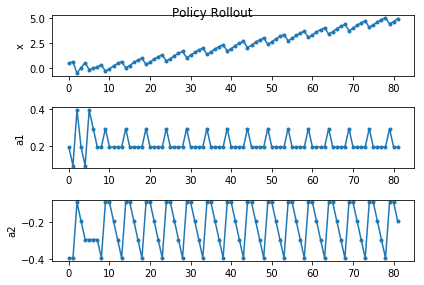

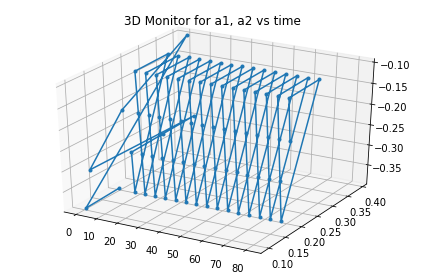

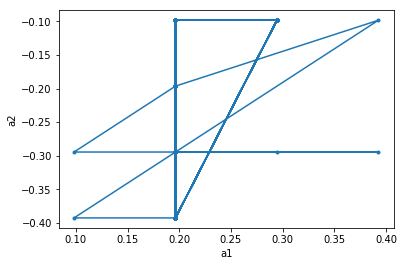

In 82 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 82 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  82 th iteration, the robot moved  0.23246068827449218  in x direction


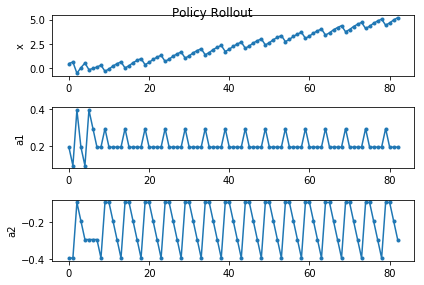

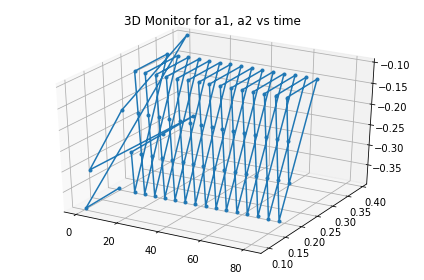

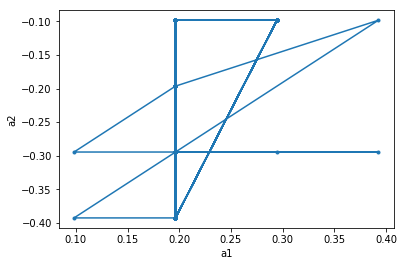

In 83 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 83 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  83 th iteration, the robot moved  0.18777782447860947  in x direction


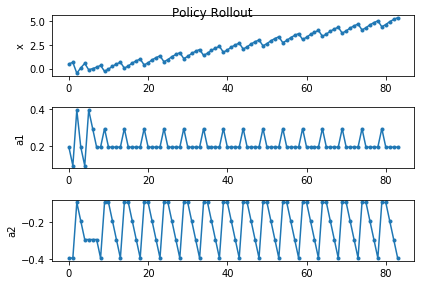

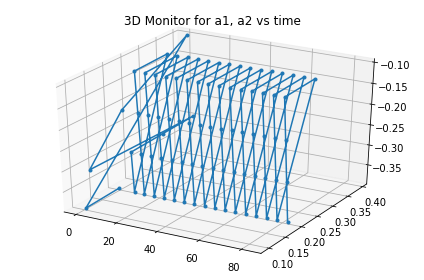

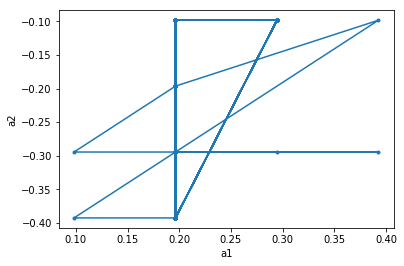

In 84 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 84 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  84 th iteration, the robot moved  -0.6206024669245336  in x direction


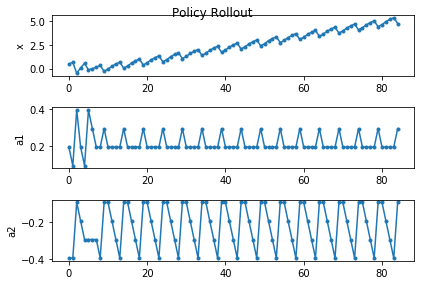

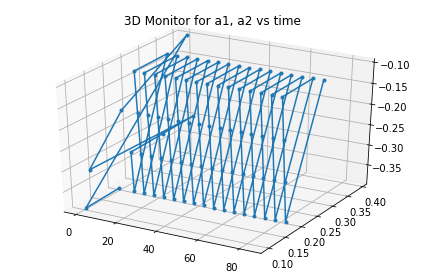

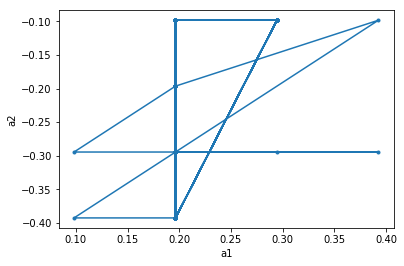

In 85 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 85 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  85 th iteration, the robot moved  0.22918484166091613  in x direction


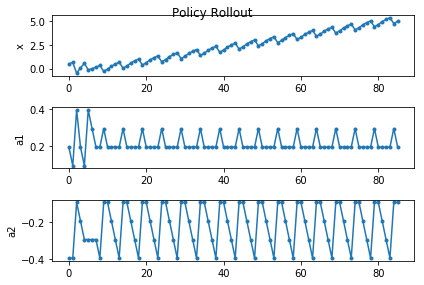

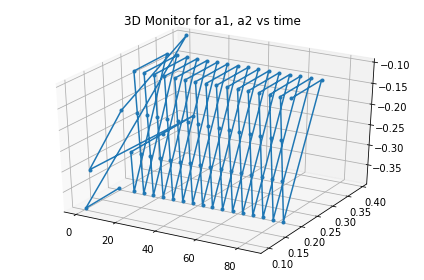

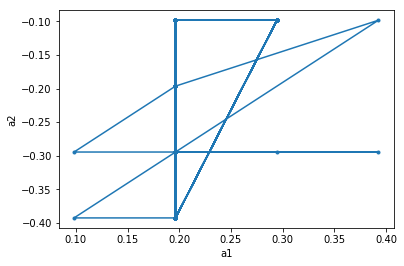

In 86 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 86 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  86 th iteration, the robot moved  0.30795840903019567  in x direction


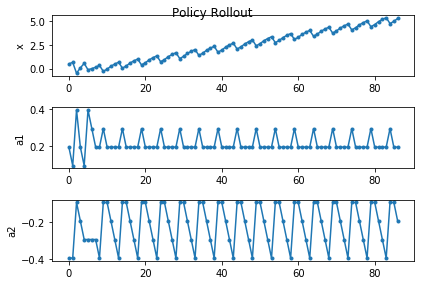

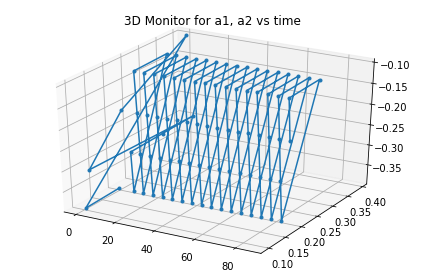

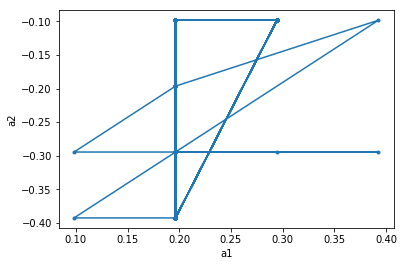

In 87 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 87 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  87 th iteration, the robot moved  0.23246068827449218  in x direction


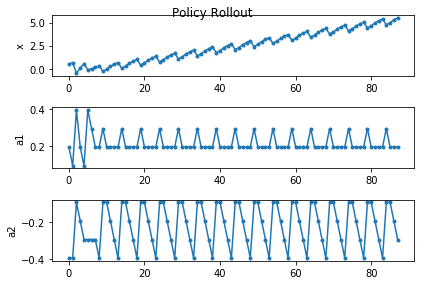

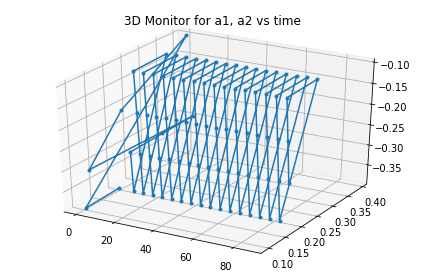

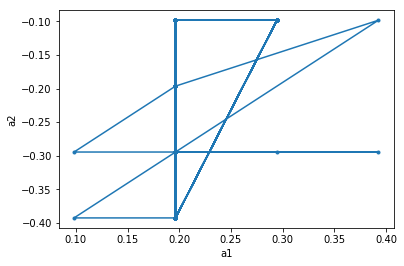

In 88 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 88 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  88 th iteration, the robot moved  0.18777782447860947  in x direction


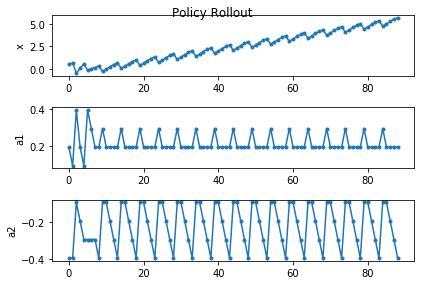

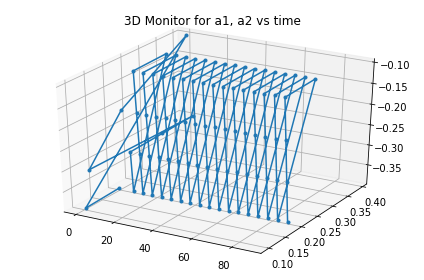

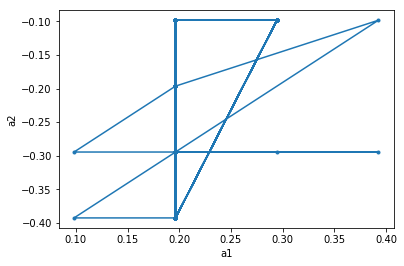

In 89 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 89 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  89 th iteration, the robot moved  -0.6206024669245336  in x direction


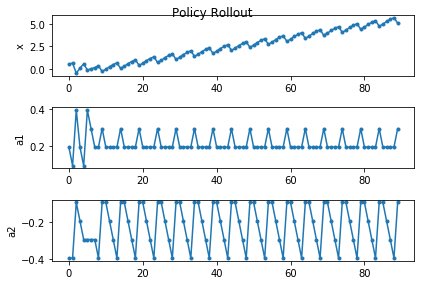

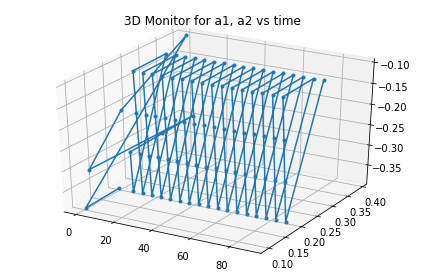

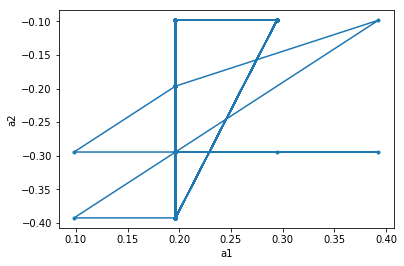

In 90 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 90 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  90 th iteration, the robot moved  0.22918484166091613  in x direction


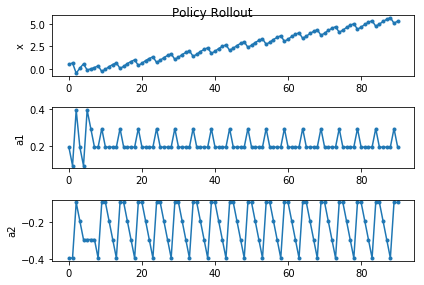

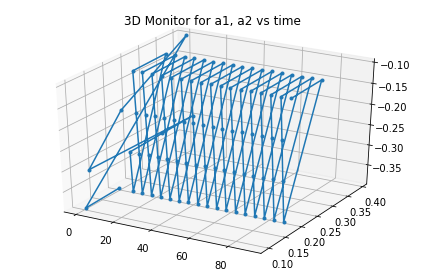

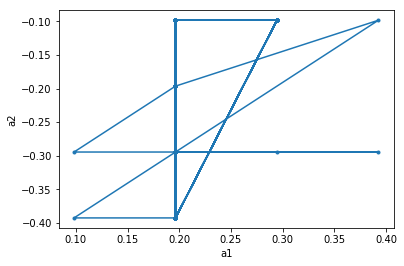

In 91 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 91 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  91 th iteration, the robot moved  0.30795840903019567  in x direction


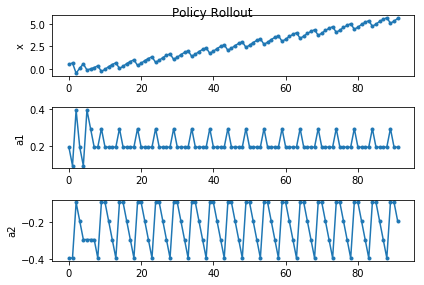

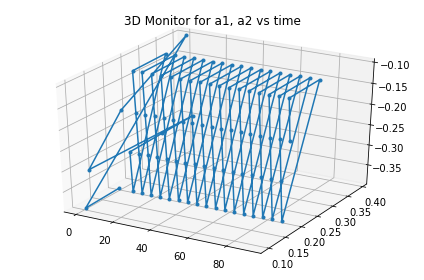

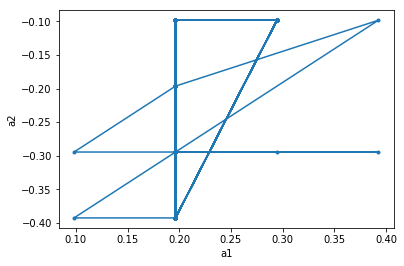

In 92 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 92 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  92 th iteration, the robot moved  0.23246068827449218  in x direction


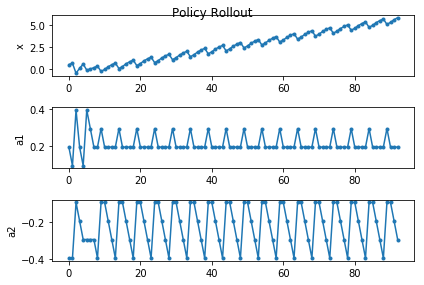

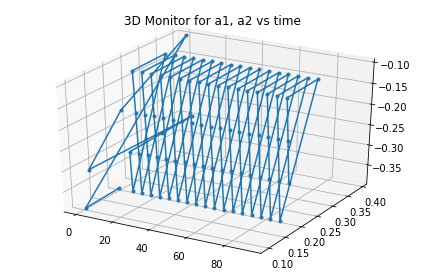

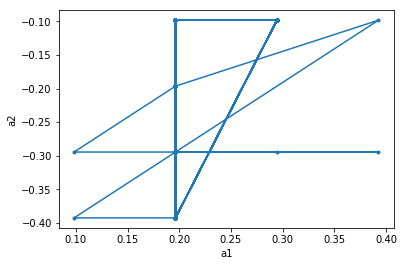

In 93 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 93 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  93 th iteration, the robot moved  0.18777782447860947  in x direction


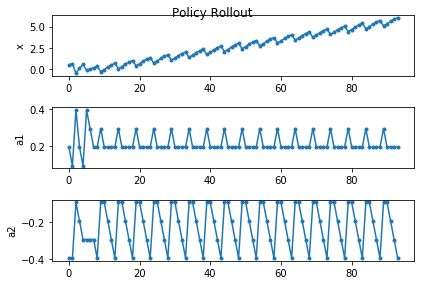

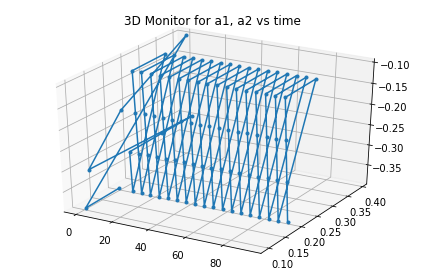

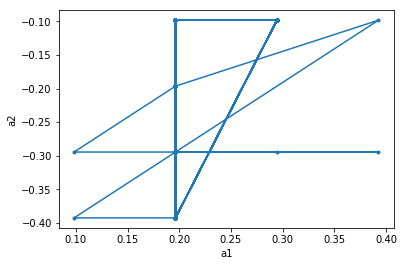

In 94 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 94 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  94 th iteration, the robot moved  -0.6206024669245336  in x direction


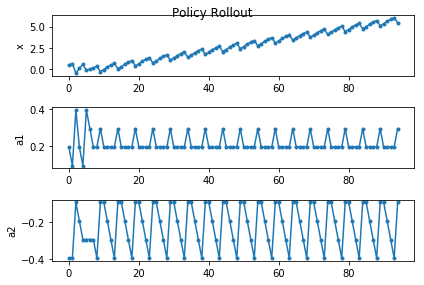

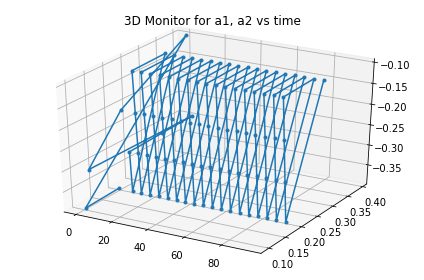

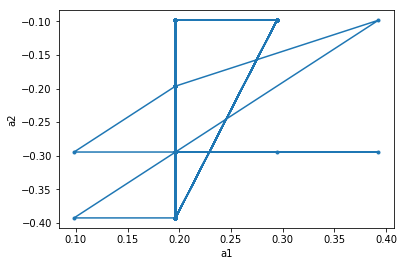

In 95 th iteration the initial state is:  (0.29452431, 0.29452431, -0.09817477)
In 95 th iteration the chosen action is:  (-0.098174769999999995, 0.0)
In  95 th iteration, the robot moved  0.22918484166091613  in x direction


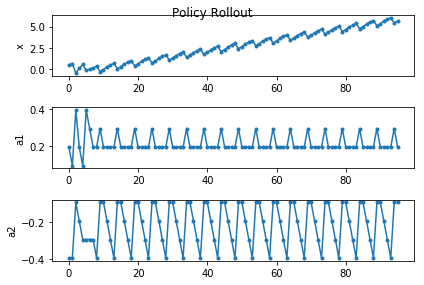

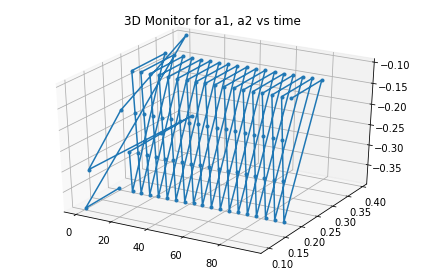

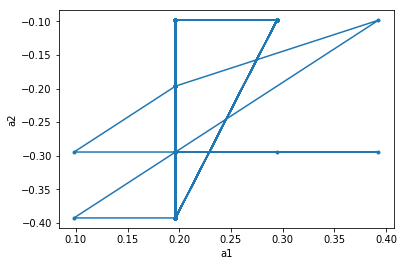

In 96 th iteration the initial state is:  (0.39269908, 0.19634954, -0.09817477)
In 96 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  96 th iteration, the robot moved  0.30795840903019567  in x direction


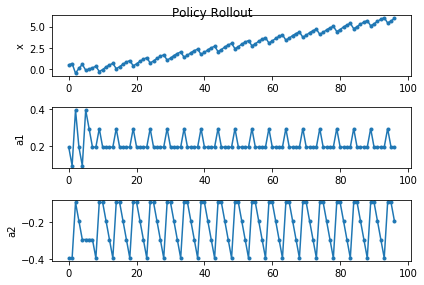

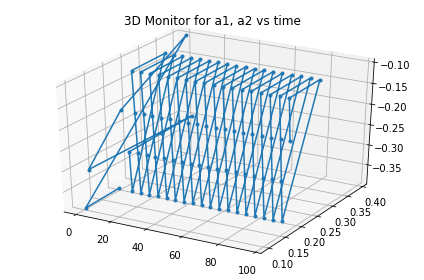

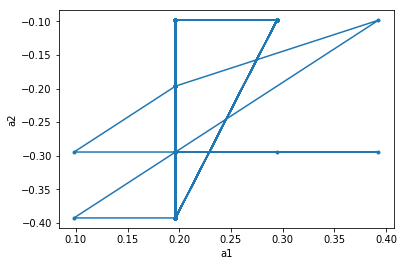

In 97 th iteration the initial state is:  (0.39269908, 0.19634954, -0.19634954)
In 97 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  97 th iteration, the robot moved  0.23246068827449218  in x direction


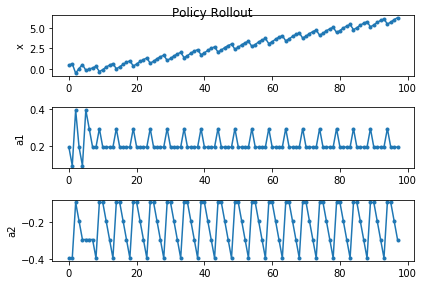

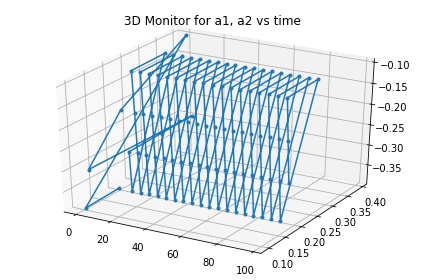

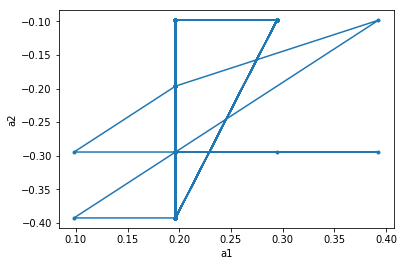

In 98 th iteration the initial state is:  (0.39269908, 0.19634954, -0.29452431)
In 98 th iteration the chosen action is:  (0.0, -0.098174769999999995)
In  98 th iteration, the robot moved  0.18777782447860947  in x direction


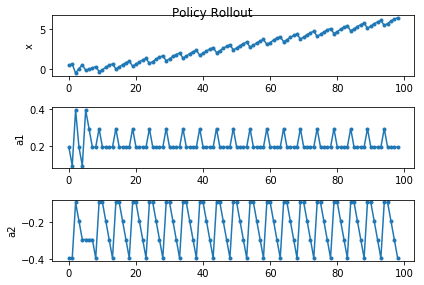

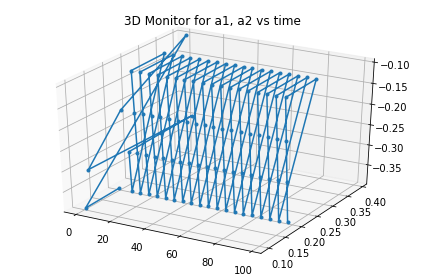

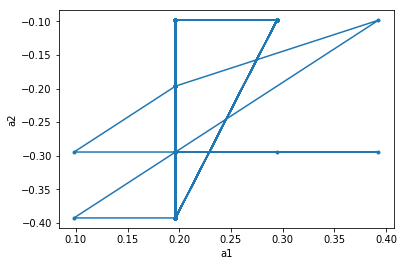

In 99 th iteration the initial state is:  (0.39269908, 0.19634954, -0.39269908)
In 99 th iteration the chosen action is:  (0.098174769999999995, 0.29452431000000001)
In  99 th iteration, the robot moved  -0.6206024669245336  in x direction


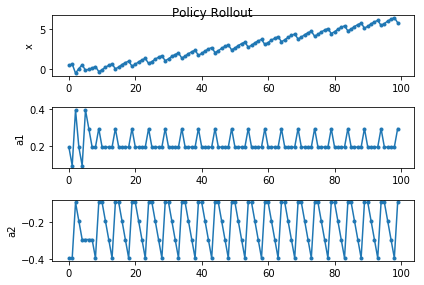

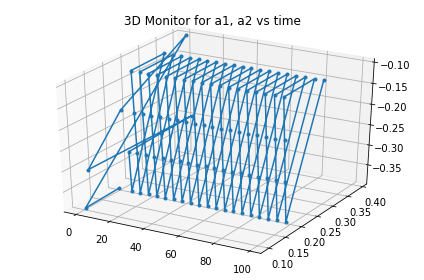

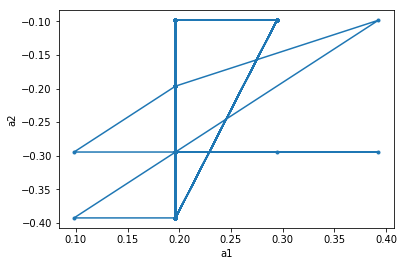

In [16]:
robot4 = ThreeLinkRobot(x=0,
                       y=0,
                       theta=pi/32,
                       a1=pi/16,
                       a2=-pi/16,
                       link_length=2,
                       t_interval=0.001,
                       a_interval=pi/32)
%matplotlib inline
x_displacement = test_policy(robot=robot4, policy=policy, timestep=100)